# Note

This notebook is full of computationally heavy tasks. Therefore to avoid recalculating all that I have always dumped heavily calculated objects in `dumped_objects` under the variable's name `<var_name>.pckl`. Try to load the objects instead of recalculating demanding processes.

# Data Loading & Optimization

We load the initial training data. Skip this entire section if the train model is available under `analysis_best_model/best_model_bayesian_optimization.h5` and jump down to <font style="font-size:13pt; font-weight: bold">Load The Model</font>
    
There are two options available. In order not repeat all the calculations, I have made the bit vectors available on disk. You can just load them using the following commands

In [504]:
## dump data
with open('dumped_objects/bits.pckl', 'wb') as f:
    pickle.dump([X_train, y_train, X_valid, y_valid, X_test, y_test], f)

In [ ]:
## load data
with open('dumped_objects/bits.pckl', 'rb') as f:
    X_train, y_train, X_valid, y_valid, X_test, y_test = pickle.load(f)

## Calculating Fingerprints

In [1]:
import rdkit 
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import SimilarityMaps
from rdkit import DataStructs

import numpy as np
import pandas as pd
import random
import time
import pickle

from IPython.display import SVG

These are some utilities or global variables that I'll need all over the entire notebook

In [31]:
color_map = {'verylightgreen': '#b3ffdb', 'verylightred': '#ffb3b3', 'verylightblue': '#a1c7c1', 'pleasantgreen': '#60a670', 'lightorange': '#ebc14d', 'darkorange': '#ad861a', 'fire': '#bf8000'}
color_palette = ["#911111", "#346b29", "#4257f5", "#748046", "#9da39d", "#124543"]

In [2]:
supplier = Chem.SDMolSupplier('data/cas_4337.sdf')
infos = [{} for mol in supplier]
# for every molecule, calculate all found fingerprints
fingerprints = np.array([AllChem.GetMorganFingerprintAsBitVect(supplier[i], 3, nBits=2048, bitInfo=infos[i]) 
                         for i in range(len(supplier))])

In [3]:
infos[0]

{47: ((6, 3),),
 119: ((3, 2),),
 155: ((0, 1),),
 305: ((13, 3),),
 322: ((22, 1),),
 323: ((1, 1),),
 371: ((20, 3),),
 378: ((5, 0),),
 389: ((16, 2), (19, 2)),
 434: ((5, 3),),
 471: ((4, 2),),
 498: ((11, 3), (14, 3)),
 507: ((0, 3),),
 566: ((3, 3),),
 661: ((2, 2),),
 695: ((23, 0),),
 718: ((20, 2), (21, 2)),
 736: ((6, 2), (9, 2), (7, 2), (10, 2)),
 781: ((23, 2),),
 798: ((0, 2),),
 831: ((22, 2),),
 840: ((1, 3),),
 841: ((24, 1),),
 859: ((2, 3),),
 896: ((17, 2), (18, 2)),
 1057: ((24, 0),),
 1088: ((11, 1), (14, 1), (12, 1), (16, 1), (15, 1), (19, 1)),
 1114: ((3, 0),),
 1160: ((2, 1), (4, 1), (13, 1)),
 1199: ((11, 2), (12, 2), (14, 2), (15, 2)),
 1218: ((5, 2),),
 1322: ((4, 3),),
 1380: ((0, 0), (1, 0), (2, 0), (4, 0), (8, 0), (13, 0), (22, 0)),
 1454: ((8, 2),),
 1472: ((1, 2),),
 1523: ((17, 3),),
 1536: ((23, 1),),
 1609: ((8, 1),),
 1698: ((13, 2),),
 1745: ((3, 1),),
 1750: ((6, 1), (7, 1), (9, 1), (10, 1), (17, 1), (18, 1), (20, 1), (21, 1)),
 1831: ((8, 3),),
 1

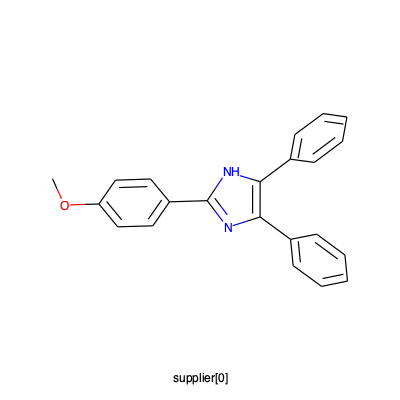

In [4]:
img = Draw.MolToImage(supplier[0], size=(400, 400), legend="supplier[0]", useSVG=True)
img.save('plots/supplier[0].png')
img

In [5]:
from wand.image import Image
def save_svg2png(filename='mona-lisa.png', resolution=1920, size=(800, 800)):
    """Reads an SVG string and converts it to png image. The png image is stored under the name 'mona-lisa.png' if
    no name has been provided. Function returns the png image object too for further desired processing.
    Params:
    --------
    filename:   path where the image should be stored
    size:       (tuple) specifies the dimension of the result image
    resolution: (int) specifies resolution of the result image. Default is 1920. That's almost HD.
    """
    svg_image = Image(blob=bytes(svg,'UTF-8'), format="svg", resolution=resolution) # increase resolution
    svg_image.resize(size[0], size[1]) 
    png_image = Image(blob=svg_image.make_blob("png"), format="png")
    png_image.save(filename=filename)
    return png_image

Here the bit (fingerprint) $736$ can be found 4 times in this molecule, let's have a look where.

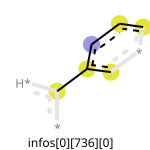

In [759]:
svg = Draw.DrawMorganBit(supplier[0], 736, infos[0], 0, legend='infos[0][736][0]')
save_svg2png('plots/infos[0][736][0].png')
SVG(svg)

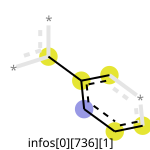

In [760]:
svg = Draw.DrawMorganBit(supplier[0], 736, infos[0], 1, legend='infos[0][736][1]')
save_svg2png('plots/infos[0][736][1].png')
SVG(svg)

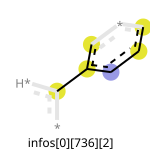

In [761]:
svg = Draw.DrawMorganBit(supplier[0], 736, infos[0], 2, legend='infos[0][736][2]')
save_svg2png('plots/infos[0][736][2].png')
SVG(svg)

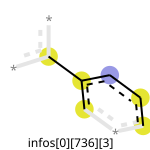

In [762]:
svg = Draw.DrawMorganBit(supplier[0], 736, infos[0], 3, legend='infos[0][736][3]')
save_svg2png('plots/infos[0][736][3].png')
SVG(svg)

## Splitting Dataset

into train and validation sets. These are the validation indices that we'll extract from the entire dataset.

In [10]:
valid_ids = [6,   10,   29,   32,   42,   58,   72,   83,   98,  100,  128, 
        145,  148,  168,  171,  205,  208,  237,  244,  285,  290,  291,
         300,  312,  332,  334,  335,  347,  356,  369,  371,  377,  407,
         424,  456,  458,  470,  472,  486,  514,  515,  528,  557,  563,
         599,  610,  616,  628,  640,  701,  704,  722,  764,  794,  818,
         821,  840,  850,  856,  859,  874,  878,  882,  898,  901,  925,
         936,  945,  957,  974,  977, 1013, 1019, 1030, 1038, 1047, 1049,
        1072, 1073, 1100, 1159, 1168, 1187, 1190, 1194, 1201, 1202, 1233,
        1247, 1258, 1264, 1273, 1283, 1288, 1300, 1302, 1319, 1339, 1349,
        1402, 1413, 1416, 1422, 1426, 1435, 1454, 1465, 1483, 1502, 1513,
        1515, 1520, 1548, 1576, 1604, 1606, 1621, 1650, 1695, 1696, 1711,
        1714, 1716, 1725, 1743, 1746, 1752, 1780, 1788, 1794, 1799, 1813,
        1826, 1866, 1886, 1901, 1903, 1921, 1929, 1940, 1969, 1970, 1997,
        1998, 2008, 2010, 2011, 2018, 2023, 2046, 2060, 2064, 2080, 2081,
        2131, 2171, 2182, 2203, 2212, 2224, 2231, 2241, 2246, 2283, 2294,
        2295, 2297, 2327, 2329, 2331, 2349, 2357, 2360, 2365, 2397, 2413,
        2417, 2418, 2421, 2448, 2467, 2510, 2516, 2528, 2533, 2549, 2562,
        2601, 2604, 2606, 2609, 2611, 2632, 2644, 2653, 2677, 2682, 2685,
        2692, 2703, 2708, 2714, 2719, 2726, 2732, 2759, 2761, 2776, 2780,
        2817, 2818, 2829, 2837, 2857, 2858, 2884, 2899, 2902, 2905, 2911,
        2939, 2975, 2977, 2986, 3007, 3009, 3018, 3024, 3038, 3066, 3087,
        3098, 3107, 3117, 3122, 3139, 3157, 3161, 3164, 3217, 3223, 3233,
        3263, 3265, 3271, 3290, 3295, 3307, 3313, 3317, 3321, 3382, 3384,
        3388, 3400, 3409, 3412, 3419, 3423, 3449, 3470, 3487, 3488, 3503,
        3509, 3511, 3539, 3562, 3626, 3637, 3654, 3662, 3663, 3668, 3671,
        3688, 3689, 3695, 3710, 3726, 3743, 3744, 3782, 3791, 3794, 3808,
        3809, 3841, 3849, 3874, 3910, 3912, 3925, 3945, 3950, 3958, 3959,
        3962, 3964, 3967, 3978, 3993, 4009, 4010, 4055, 4057, 4085, 4089,
        4096, 4099, 4107, 4112, 4129, 4135, 4151, 4155, 4196, 4209, 4216,
        4234, 4236, 4251, 4267, 4283, 4317, 4326, 4335
]

Every molecule whose index is found in `valid_ids`, add to the validation set, and every molecule that isn't is added to the training set.

In [11]:
X_train, X_valid = [], []
for i in range(len(fingerprints)):
    if i in valid_ids:
        X_valid.append(fingerprints[i])
    else:
        X_train.append(fingerprints[i])
X_train = np.array(X_train, dtype=np.uint8)
X_valid = np.array(X_valid, dtype=np.uint8)

Collecting the lables from the supplier

In [12]:
y_train, y_valid, i = [], [], 0
for mol in supplier:
    if mol.GetProp("Ames test categorisation") == "mutagen":
        if i in valid_ids:
            y_valid.append(1)
        else:
            y_train.append(1)
    else:
        if i in valid_ids:
            y_valid.append(0)
        else:
            y_train.append(0)
    i+=1
    
y_train = np.array(y_train, dtype=np.uint8)
y_valid = np.array(y_valid, dtype=np.uint8)

## Optimizing Model's Architecture

Using the Bayesian Inference. Here we use as a target metric the AUC score return by the model when run on the validation set. At the end we compare each to the one returned on the test set.

In [57]:
from keras import backend as K
from keras.models import Sequential
from keras.layers import Activation, Dropout
from keras.layers.core import Dense
from keras.optimizers import SGD, Adam, RMSprop, Adagrad

from sklearn.metrics import roc_auc_score

from bayes_opt import BayesianOptimization

Here we set the our search space as well as the substitution function

In [141]:
len(['lecun_uniform', 'he_uniform', 'uniform', 'he_normal', 'normal'])

5

In [143]:
param_reference = {'init': ['lecun_uniform', 'he_uniform', 'uniform', 'he_normal', 'normal'],
             'activation': ['relu', 'sigmoid', 'selu'],
              'optimizer': ['SGD', 'Adam', 'RMSprop']
                  }

search_space = {'units': (5, 1024), # discrete
                'activation': (0, 2), # categorical
                'optimizer': (0, 2), # categorical
                'lr': (.00001, .2), # continuous
                'n_layers': (2, 15), # discrete
                'epochs': (5, 30), # discrete
                'batch_size': (1, 200), # discrete
                'momentum': (0.001, 0.5), # continuous
                'init': (0, 4), # categorical
                'dropout_rate': (0.0001, 0.5) # continuous
               }



input_dim = X_valid.shape[1]
def train_evaluate_and_auc(units, activation, optimizer, lr, n_layers, epochs, batch_size, momentum, init, dropout_rate):
    # handle categorical
    activation = param_reference['activation'][int(round(activation))]
    optimizer = param_reference['optimizer'][int(round(optimizer))]
    init = param_reference['init'][int(round(init))]
    # handle discrete
    units = int(round(units))
    n_layers = int(round(n_layers))
    epochs = int(round(epochs))
    batch_size = int(round(batch_size))
    tac()
    
    # build classifier with corresponding hyperparameters
    K.clear_session()
    classifier = Sequential()
    classifier.add(
        Dense(units=units, input_dim=input_dim, activation=activation, kernel_initializer=init) # input layer
    )
    # Create an arbitrary number of Hidden Layers
    for n in range(n_layers):
        classifier.add(Dense(units=units, activation=activation))
        classifier.add(Dropout(dropout_rate))
    classifier.add(Dense(units=1, activation='sigmoid'))     # Output Layer
    optimizer_eval = eval(optimizer+'(learning_rate={}, momentum={})'.format(lr, momentum)) if optimizer=='SGD' else eval(optimizer+'(learning_rate={})'.format(lr))
    classifier.compile(loss='binary_crossentropy', optimizer=optimizer_eval, metrics=['accuracy'])
    classifier.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, verbose=0)
    return roc_auc_score(y_valid, classifier.predict(X_valid))

The following cell provides just an implementation for accurate timing for the elapsed time in calculating the integrated gradients.

In [53]:
import time

_start_time = time.time()

def tic():
    global _start_time 
    _start_time = time.time()

def tac():
    t_sec = round(time.time() - _start_time)
    (t_min, t_sec) = divmod(t_sec,60)
    (t_hour,t_min) = divmod(t_min,60) 
    print('Time passed: {}hour:{}min:{}sec'.format(t_hour,t_min,t_sec))

This cell is very heavy, don't run unless deliberate

In [144]:
tic()
optimization = BayesianOptimization(f=train_evaluate_and_auc, pbounds=search_space, random_state=0, verbose=0)
optimization.maximize(init_points=20, n_iter=40)
print("Bayesian Optimization took")
tac()
optimization.max

Time passed: 0hour:0min:0sec
Time passed: 0hour:0min:38sec
Time passed: 0hour:3min:42sec
Time passed: 0hour:4min:31sec
Time passed: 0hour:5min:20sec
Time passed: 0hour:5min:26sec
Time passed: 0hour:5min:33sec
Time passed: 0hour:5min:37sec
Time passed: 0hour:5min:45sec
Time passed: 0hour:6min:45sec
Time passed: 0hour:6min:47sec
Time passed: 0hour:9min:22sec
Time passed: 0hour:9min:54sec
Time passed: 0hour:10min:11sec
Time passed: 0hour:10min:34sec
Time passed: 0hour:15min:33sec
Time passed: 0hour:15min:40sec
Time passed: 0hour:15min:55sec
Time passed: 0hour:16min:4sec
Time passed: 0hour:16min:17sec
Time passed: 0hour:17min:3sec
Time passed: 0hour:19min:10sec
Time passed: 0hour:22min:51sec
Time passed: 0hour:33min:46sec
Time passed: 0hour:53min:16sec
Time passed: 0hour:53min:30sec
Time passed: 0hour:53min:46sec
Time passed: 0hour:54min:5sec
Time passed: 0hour:54min:21sec
Time passed: 1hour:0min:7sec
Time passed: 1hour:3min:59sec
Time passed: 1hour:4min:40sec
Time passed: 1hour:6min:52sec

{'target': 0.9048096571558314,
 'params': {'activation': 0.0,
  'batch_size': 138.64074771309762,
  'dropout_rate': 0.0001,
  'epochs': 30.0,
  'init': 4.0,
  'lr': 0.2,
  'momentum': 0.5,
  'n_layers': 2.0,
  'optimizer': 0.0,
  'units': 805.6230341965053}}

### Set of best hyperparameters

Because the optimization treats all hyperparameters in a continuous way, let's convert them into a interpretable way.

In [146]:
import re
def convert_to_interpretable_dict(optimization_max):
    """ Returns an interpretable dictionary given the a single dictionary from the Bayesian Optimization object above
    """
    interpretable_dict = {}
    interpretable_dict['AUC'] = optimization_max['target']
    interpretable_dict['activation'] = param_reference['activation'][int(round(optimization_max['params']['activation']))] # categorical
    interpretable_dict['batch_size'] = int(round(optimization_max['params']['batch_size']))
    interpretable_dict['dropout_rate'] = optimization_max['params']['dropout_rate']
    interpretable_dict['epochs'] = int(round(optimization_max['params']['epochs']))
    interpretable_dict['init'] = param_reference['init'][int(round(optimization_max['params']['init']))] # categorical
    interpretable_dict['lr'] = optimization_max['params']['lr']
    interpretable_dict['momentum'] = optimization_max['params']['momentum']
    interpretable_dict['n_layers'] = int(round(optimization_max['params']['n_layers']))
#     interpretable_dict['optimizer'] = re.findall("[A-Z|a-z]+\'", str(param_reference['optimizer'][int(round(optimization_max['params']['optimizer']))]))[0][:-1] # categorical
    interpretable_dict['optimizer'] = param_reference['optimizer'][int(round(optimization_max['params']['optimizer']))] # categorical
    interpretable_dict['units'] = int(round(optimization_max['params']['units']))
    return interpretable_dict

Here we list the history of the Bayesian optimization hyperparameters search listed by their AUC score.

In [147]:
import pandas as pd

interpretable_dicts = {}
for param, i in zip(optimization.res, range(len(optimization.res))):    
    interpretable_dicts[i+1] = convert_to_interpretable_dict(param)
param_summary = pd.DataFrame.from_dict(interpretable_dicts, orient='index')
param_summary.sort_values('AUC', ascending=False).style.set_capztion("Results of Bayesian Optimization: best set of hyperparameters (Validation Set)").bar('AUC', color=color_map['pleasantgreen'])

,AUC,activation,batch_size,dropout_rate,epochs,init,lr,momentum,n_layers,optimizer,units
44,0.90481,relu,139,0.0001,30,normal,0.2,0.5,2,SGD,806
52,0.903504,relu,67,0.0001,5,lecun_uniform,0.2,0.001,2,SGD,541
43,0.901007,relu,79,0.0001,5,normal,0.2,0.001,2,SGD,627
37,0.900136,relu,49,0.0001,30,normal,0.2,0.5,2,SGD,669
31,0.895709,relu,200,0.0001,30,lecun_uniform,0.2,0.001,2,SGD,811
46,0.895274,relu,200,0.0001,30,normal,0.2,0.5,2,SGD,870
58,0.892606,relu,69,0.5,30,normal,0.2,0.5,15,SGD,522
59,0.89077,relu,200,0.0001,30,normal,0.2,0.5,2,SGD,645
55,0.89026,relu,28,0.0001,30,normal,0.2,0.5,2,SGD,545
42,0.889351,relu,200,0.0001,30,normal,0.2,0.001,2,SGD,929


## Running Models on Test set

Make sure to specify the `input_shape` instead of usual `input_dim`. <font style="font-family: georgia; font-weight: normal; font-size: 16pt">Keras</font> has updated there Dense constructor. Because there's a good chance for a model to have scored well on the validation set due to 'good' initialization, we want to avoid this optimistic selection criterion of the model and find out their AUCs on the test set each.

In [207]:
param_summary_dict = param_summary.sort_values('AUC', ascending=False).to_dict(orient='index')

aucs_test = {}
tic()
for (k, v), i in zip(param_summary_dict.items(), range(20)):
    # build model with corresponding hyperparameters
    K.clear_session()
    model = Sequential()
    model.add(
        Dense(units=v['units'], input_shape=X_valid[0].shape, activation=v['activation'], kernel_initializer=v['init']) # input layer
    )
    # Create an arbitrary number of Hidden Layers
    for n in range(v['n_layers']):
        model.add(Dense(units=v['units'], activation=v['activation']))
        model.add(Dropout(v['dropout_rate']))
    model.add(Dense(units=1, activation='sigmoid'))     # Output Layer
    optimizer_eval = eval(v['optimizer']+'(learning_rate={}, momentum={})'.format(v['lr'], v['momentum'])) if v['optimizer']=='SGD' else eval(v['optimizer']+'(learning_rate={})'.format(v['lr']))
    model.compile(loss='binary_crossentropy', optimizer=optimizer_eval, metrics=['accuracy'])
    model.fit(X_train, y_train, batch_size=v['batch_size'], epochs=v['epochs'], verbose=0)
    aucs_test[k] = roc_auc_score(y_test, model.predict(X_test))
    tac()

Time passed: 0hour:0min:33sec
Time passed: 0hour:0min:37sec
Time passed: 0hour:0min:42sec
Time passed: 0hour:1min:15sec
Time passed: 0hour:1min:45sec
Time passed: 0hour:2min:15sec
Time passed: 0hour:3min:33sec
Time passed: 0hour:3min:52sec
Time passed: 0hour:4min:24sec
Time passed: 0hour:4min:54sec
Time passed: 0hour:5min:1sec
Time passed: 0hour:5min:20sec
Time passed: 0hour:5min:26sec
Time passed: 0hour:37min:54sec
Time passed: 0hour:37min:59sec
Time passed: 0hour:38min:5sec
Time passed: 0hour:43min:37sec
Time passed: 0hour:43min:39sec
Time passed: 0hour:44min:33sec
Time passed: 0hour:48min:20sec


In [228]:
param_summary_test = param_summary.sort_values('AUC', ascending=False).iloc[:20]
param_summary_test['AUC'] = aucs_test.values()
param_summary_test.style.set_caption("First 20 best-scoring models from Bayesian Optimization: AUC score on Test set").bar('AUC', color=color_map['pleasantgreen'])

,AUC,activation,batch_size,dropout_rate,epochs,init,lr,momentum,n_layers,optimizer,units
44,0.829586,relu,139,0.0001,30,normal,0.2,0.5,2,SGD,806
52,0.830605,relu,67,0.0001,5,lecun_uniform,0.2,0.001,2,SGD,541
43,0.806925,relu,79,0.0001,5,normal,0.2,0.001,2,SGD,627
37,0.826989,relu,49,0.0001,30,normal,0.2,0.5,2,SGD,669
31,0.833247,relu,200,0.0001,30,lecun_uniform,0.2,0.001,2,SGD,811
46,0.833887,relu,200,0.0001,30,normal,0.2,0.5,2,SGD,870
58,0.83395,relu,69,0.5,30,normal,0.2,0.5,15,SGD,522
59,0.824127,relu,200,0.0001,30,normal,0.2,0.5,2,SGD,645
55,0.833872,relu,28,0.0001,30,normal,0.2,0.5,2,SGD,545
42,0.831465,relu,200,0.0001,30,normal,0.2,0.001,2,SGD,929


In [229]:
with open('dumped_objects/optimization.pckl', 'wb') as f:
    pickle.dump([optimization, param_summary, param_summary_test], f)

In [229]:
with open('dumped_objects/optimization.pckl', 'rb') as f:
    optimization, param_summary, param_summary_test = pickle.load(f)

In [423]:
param_summary.to_csv('analysis_best_model/param_summary.csv')
param_summary_test.to_csv('analysis_best_model/param_summary_test.csv')

Now we compare both aucs together and find out the one that scored highest on both. I.e. $MAX(AUC_{test} + AUC_{valid})$

In [239]:
auc_valid_test_comparison = pd.DataFrame.from_dict({'AUC_Valid': param_summary.sort_values('AUC', ascending=False).iloc[:20]['AUC'], 'AUC_Test': param_summary_test['AUC']})
auc_valid_test_comparison['Sum'] = auc_valid_test_comparison['AUC_Valid'] +  auc_valid_test_comparison['AUC_Test']
auc_valid_test_comparison.sort_values('Sum', ascending=False).style.set_caption("Comparison of AUC score of first 20 models (validation set vs. Test set").bar('Sum', color=color_map['pleasantgreen'])

,AUC_Valid,AUC_Test,Sum
44,0.90481,0.829586,1.7344
52,0.903504,0.830605,1.73411
46,0.895274,0.833887,1.72916
31,0.895709,0.833247,1.72896
37,0.900136,0.826989,1.72713
58,0.892606,0.83395,1.72656
55,0.89026,0.833872,1.72413
42,0.889351,0.831465,1.72082
36,0.886759,0.832952,1.71971
59,0.89077,0.824127,1.7149


In [241]:
auc_valid_test_comparison.sort_values('AUC_Test', ascending=False).style.set_caption("Comparison of AUC score of first 20 models (best is highest AUC_Test").bar('AUC_Test', color=color_map['pleasantgreen'])

,AUC_Valid,AUC_Test,Sum
58,0.892606,0.83395,1.72656
46,0.895274,0.833887,1.72916
55,0.89026,0.833872,1.72413
31,0.895709,0.833247,1.72896
36,0.886759,0.832952,1.71971
42,0.889351,0.831465,1.72082
52,0.903504,0.830605,1.73411
44,0.90481,0.829586,1.7344
34,0.886248,0.827089,1.71334
37,0.900136,0.826989,1.72713


Considering that all datasets are more or less balanced, I'll reconstruct the model with the highest **AUC_Test**

In [252]:
dataset_distributions = {}
dataset_distributions['Train'] = np.unique(y_train, return_index=False, return_inverse=False, return_counts=True)[1]/len(y_train)
dataset_distributions['Valid'] = np.unique(y_valid, return_index=False, return_inverse=False, return_counts=True)[1]/len(y_valid)
dataset_distributions['Test'] = np.unique(y_test, return_index=False, return_inverse=False, return_counts=True)[1]/len(y_test)
pd.DataFrame.from_dict(dataset_distributions, orient='index', columns=[0, 1])

,0,1
Train,0.446384,0.553616
Valid,0.446483,0.553517
Test,0.490196,0.509804


In [276]:
np.arange(0, np.max(dataset_distributions['Train']), 0.05)

0

AttributeError: 'AxesSubplot' object has no attribute 'set_ticks'

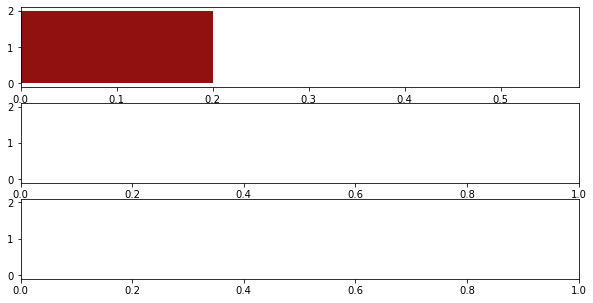

In [348]:
fig, axs = plt.subplots(3, 1, figsize=(10, 5), sharey=True)
for key, dataset, color, ax in zip(dataset_distributions, [y_train, y_valid, y_test], color_palette, axs):
    ax.hist(datase, density=True, align='mid', orientation='horizontal', width=0.2, color=color, range=(-.5, 1.6))
#     ax.yticks(ticks=[0, 1], labels=["0\nnon-toxic", "1 \ntoxic"])
    ax.set_ticks(np.arange(0, np.max(dataset_distributions[key]), 0,5))
#     ax.xticks(ticks=np.arange(0, np.max(dataset_distributions[key]), 0.05))
fig.show()

## Reconstructing Best Model

### Winner

We have a winner-model here apparently

In [364]:
pd.DataFrame.from_dict(param_summary_test.loc[58]).T

,AUC,activation,batch_size,dropout_rate,epochs,init,lr,momentum,n_layers,optimizer,units
58,0.83395,relu,69,0.5,30,normal,0.2,0.5,15,SGD,522


In [356]:
# build model with corresponding hyperparameters
K.clear_session()
model = Sequential()
model.add(
    Dense(units=522, input_shape=X_valid[0].shape, activation='relu', kernel_initializer='normal') # input layer
)
# Create an arbitrary number of Hidden Layers
for n in range(15):
    model.add(Dense(units=522, activation='relu'))
    model.add(Dropout(0.5))
model.add(Dense(units=1, activation='sigmoid'))     # Output Layer
model.compile(loss='binary_crossentropy', optimizer=SGD(learning_rate=0.2, momentum=0.5), metrics=['accuracy'])
model.fit(X_train, y_train, batch_size=69, epochs=30, verbose=0)

### Loading Test set

Run the following 2 cells to load the test set, and then will obtain them in `X_test`, `y_test`

In [17]:
import csv

smiles, y_test = [], []
with open('data/test.csv') as f:
    csv_reader = csv.reader(f, delimiter=',')
    for row in csv_reader:
        if row[1] != 'smiles':
            # read smiles from the 2nd column
            smiles.append(row[1])
            # read labels from the 3rd column
            y_test.append(row[2])

In [18]:
info_dicts, X_test, supplier_test = [], [], []
for smile in smiles:
    m = Chem.MolFromSmiles(smile)
    supplier_test.append(m)
    info = {}
    bit_vector = AllChem.GetMorganFingerprintAsBitVect(m, 3, nBits=2048, bitInfo=info)
    X_test.append(bit_vector)
    info_dicts.append(info)
    
X_test = np.array(X_test, dtype=np.uint8)
y_test = np.array(y_test, dtype=np.uint8)

### Plotting test set ROC

In [365]:
def plot_roc(fpr, tpr, roc_auc, isTestset=True):
    plt.figure(figsize=(12, 10), dpi=200)
    lw = 2
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.4)
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (area = ' + r'$\mathbf{%0.3f}$)'% roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=24)
    plt.ylabel('True Positive Rate', fontsize=24)
    title = 'Receiver operating characteristic'
    plt.title(title, fontsize=24)
    plt.legend(loc="lower right", fontsize=24)
    box_info = 'Test Set' if isTestset else 'Validation Set'
    plt.text(0.10, 0.95, box_info, fontsize=16, style='italic',
        verticalalignment='top', bbox=props)
    plt.savefig('plots/'+ title.replace(' ', '_') +'_'+ box_info.replace(' ', '_'))
    plt.show()

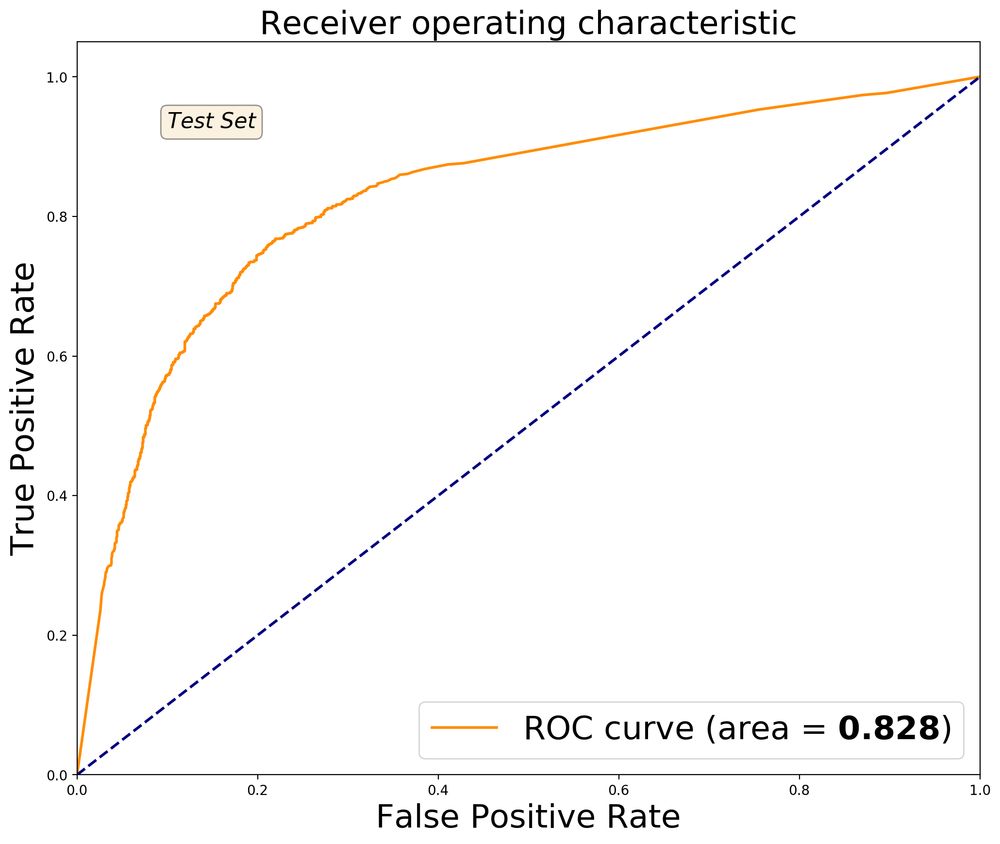

In [366]:
%matplotlib inline
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

y_test_pred = model.predict(X_test)
auc = roc_auc_score(y_test, y_test_pred)
fpr, tpr, _ = roc_curve(y_test, y_test_pred)
plot_roc(fpr, tpr, auc)

### Saving the model

For later uses. In order not to overwrite my original model, I generate a random number that gets appended to the end of the model's name.

In [367]:
import random
model.save("analysis_best_model/best_model_bayesian_optimization_{}.h5".format(random.randint(1,9999)))

### Load the Model

For later uses

In [166]:
from keras.models import load_model
model = load_model('analysis_best_model/best_model_bayesian_optimization.h5')

To see model evaluation, look at the cells above.
This was just a sanity check that I'd like to make, to make sure not to load the wrong model. So in order to check that this model has the same weights as the one reported in my last report, I had to load it and then reevaluate it on the test set, and see if I get the same AUC score.

### Plot Model's Graph

For later uses

This will convert all these matrices and vectors to bits so that takes up much less space in both memory and on the hard disk when dumped.

In [1091]:
keras.utils.vis_utils.plot_model(model, 'my_first_model_with_shape_info.png', show_shapes=True)

ImportError: Failed to import `pydot`. Please install `pydot`. For example with `pip install pydot`.

# Integrated Gradients

In the following we provide an implementation for the integrated gradients. Steps of the implementation are:
1. Consider a baseline such that the output $F(x^\prime)=\bigcirc$ where $x^\prime$ is the baseline and $\bigcirc$ is the default class. In our case, we uses the zero-vector that actually signals the absence of any fingerprints.
2. Now, interpolate a series of images, increasing in intensity ($\alpha$), between the baseline image and the original (target) image. In another word, define a function $\gamma(\alpha) \rightarrow [0, 1]$ such that $F(x_i)=1$ and $F(x_i^\prime)=0$. In our implementation, this is defined as a *lambda* function in python.
3. Gradients of the output with respect to these series of interpolated images, when calculated gives us the following

$$grad = \left[ \begin{array}{rrrrrr}
[& 0.0073032 & g_2^1 & ... & g_m^1 &] \\
[& g_1^2 & g_2^2 & \cdots & g_m^2 &] \\
[& \vdots & \vdots & \cdots & \vdots  \\
[& g_1^s & g_2^s & \cdots & g_m^s &] \\
\end{array}\right.
\left. \begin{array}{rr}
\text{when} & \alpha=\frac{1}{s} \\
 & \alpha=\frac{2}{s} \\
 & \vdots \\
 & \alpha=1 \\
\end{array}\right] \
$$

> *FIXME: write out the rest of the steps*

4. Our region of interest lies where the slope of the score vs intensity graph doesn't remain stagnant. We call these gradients - *interesting gradients*. I.e. we calculate the gradient for every potentially possible input that lies between the original input $x_i$ and the baseline $x_i^\prime$. See `t_gradients` in the implementation.

5. The integration of these series of gradients give us the Integrated gradients of the image. The result of this step is a vector that has the same dimension as the input. And each element (attribution) in this vector corresponds to one features in the input sample. That's of course is equivalent to taking the average of the interesting gradients.

6. We repeat these steps for every sample in our dataset

## Author Implementation

In the following cell, I provide the implementation of the integrated gradients that the author provides (<u>not working</u>).

In [21]:
import tensorflow as tf
from keras import backend as keras
import numpy as np

def integrated_gradients(inp, baseline, label, steps=50):
    t_input = input_tensor() # input tensor
    t_prediction = prediciton_tensor(label) # output tensor
    t_gradients = tf.gradients(t_prediction, t_input)[0] # gradients
    path_inputs = [baseline + (i/steps)*(inp-baseline) for i in range(steps)]
    grads = run_network(t_gradients, path_inputs)
    return (inp-baseline)*np.average(grads, axis=0) # integration

## My Implementation (<font style="font-family: chalkboard">Working</font>)

In the following, I provide my own implementation of the integrated gradients according to my understanding of the math formula in the paper.

However, one downside of my implementation that it takes a bit more time on my 
<font style="font-family: times; font-size:11pt">3.1 GHz Dual-Core Intel Core i5</font> CPU ($\approx 16\, sec$ per one sample in the dataset). Therefore, for practicality use the GitHub implementation.

In [873]:
def integrated_gradients_old(inp, baseline=None, steps=50):
    gradients = []
    inp = inp.reshape(1, -1) # original input
    if baseline is None:
        baseline = np.zeros(inp.shape)
    # gamma calculates the path function for a given alpha
    gamma = lambda alpha: baseline + float(alpha)/steps*(inp - baseline)

    for alpha in range(steps+1):
        input_tensor = gamma(alpha).reshape(1, -1) # path input tensor
        output_tensor = model.predict(input_tensor) # output tensor
        gradient = K.gradients(model.output, model.input)[0]
        # run the session
        sess = K.get_session()
        results = sess.run(gradient, feed_dict={model.output: output_tensor, model.input: input_tensor})[0]
        gradients.append(results)

    gradients = np.array(gradients)
    return (inp-baseline) * np.average(gradients, axis=0)

In [872]:
def integrated_gradients(inp, baseline=None, steps=50):
    """My own implementation of the integrated gradients. I've made this over the formula under section "Computing
    Integrated Gradients". Returns the a vector of attributions where each element in the vector corresponds to one
    value in the input. The attributions vector has the same shape as the input.
    @Params
    ------
    inp:    The target input. i.e. One input sample (numpy.array) (e.g. one image, one molecule).
    baseline:      (Optional) The baseline vector - if not provided, the zero-vector is calcualted.
    steps:         (Optional), number of steps for integral estimation. = 50 by default

    @Returns
    -------
    Attribution vector
    """
    if baseline is None:
        baseline = np.zeros(inp.shape)
    # gamma calculates the path function for a given alpha
    gamma = lambda alpha: baseline + alpha*(inp - baseline)
    input_tensor = np.array([gamma(alpha) for alpha in np.linspace(0, 1, num=51)])
    output_tensor = model.predict(input_tensor)
    gradient = K.gradients(model.output, model.input)[0]
    sess = K.get_session()
    results = sess.run(gradient, feed_dict={model.output: output_tensor, model.input: input_tensor})
    return (inp-baseline) * np.average(results, axis=0)

In [1089]:
tic()
integrated_gradients_old(X_test[1], baseline=baseline, steps=50)
tac()

Time passed: 0hour:6min:12sec


In [1092]:
tic()
integrated_gradients(X_test[1], baseline=baseline, steps=50)
tac()

Time passed: 0hour:0min:13sec


```python
>>> (120 * 100 / 60) / (2 * 100 / 60)
60.0
```

The difference between the old implementation and the new one is huge. It's almost $\approx60.0$ times as fast as the old one.

Checking the correctness of the path function $\gamma(\alpha)$. Gamma is working $\gamma(\alpha):R^d \rightarrow [x^\prime, x]$  such that

$$\begin{align}
\gamma(\alpha = 0) & = x^\prime \\
\gamma(\alpha = 1) & = x  \\
\end{align}$$
Where $x^\prime$ is the baseline vector, and $x$ is the original input vector.

```python
>>> gamma = lambda alpha: baseline + alpha*(inp - baseline)
>>> inp = X_test[478]
>>> baseline = np.zeros(shape=inp.shape)
>>> print("Is gamma equal to baseline when alpha=0?")
>>> print(False not in (gamma(0) == baseline))
>>> print("Is gamma equal to input when alpha=1?")
>>> print(False not in (gamma(1) == inp))

Is gamma equal to baseline when alpha=0?
True
Is gamma equal to input when alpha=1?
True
```

## Using GitHub Implemention

Because my old implementation takes too long, I was using this implementation from GitHub.

**Update 01.11.2019**: the reason why the implementation takes that long is because I construct a tensorflow graph, assigned computable tensor, compute the gradient and then clear the graph. A better implementation would be a one where the graph isn't cleared after every loop. Unfortunately, I didn't have time to re-implement this, but at some point I'll go back to it, just out of interest.

**Side note** regarding the following computations: in general, the more bigger the network, the longer it'll take to compute these attributions, regardless whether my implementation of the integrated gradients or the one from GitHub. In the case of the current model, the network has $15$ layers and $522$ units in each. So that's definitely a lot of computation.

**However, now we're not concerned with any of that because the new implementation works accordingly and is quite fast even with big networks.**

In [880]:
from modules.IntegratedGradients import integrated_gradients as IG
ig = IG(model)

/Users/kareem/miniconda3/envs/chemoinformatics/lib/python3.7/site-packages/keras/engine/sequential.py:111: UserWarning: `Sequential.model` is deprecated. `Sequential` is a subclass of `Model`, you can just use your `Sequential` instance directly.
  warnings.warn('`Sequential.model` is deprecated. '


Evaluated output channel (0-based index): All
Building gradient functions
Progress: 100.0%
Done.


Here I quickly compare my implementation to the one from GitHub. Because we'll be doing a lot of calculations, it's important to find that out at an earlier point. For that purpose, time the time needed for calculating the integrated gradients for the first 15 input samples in the test set.

In [881]:
tic()
np.array([ig.explain(inp, reference=baseline, num_steps=step) for inp in X_test[:15]])
tac()

Time passed: 0hour:0min:4sec


In [882]:
tic()
np.array([integrated_gradients(inp, baseline=baseline, steps=step) for inp in X_test[:15]])
tac()

Time passed: 0hour:1min:5sec


That's obviously still a huge difference. Therefore I'll keep using the GitHub implementation. 

## Testing different baselines

To prove the correctness of the method, the sum of attribution in one row, must be equal to the difference between predicting on the input and the baseline. I.e.

$$F(x)-F(x^\prime)=\sum_{i=1}^m a_i$$

Where $a_i$ the $i^{th}$ attribution in the attributions vector $a = [a_1, a_2, ..., a_m]$. We'll test that using $4$ different baselines, and also for different number of steps $\{50, 60, 70, 80, 90, 100\}$. The reason for that is because we would like for us to find out the adequate number of steps for integration, since introducing one float value, introduces one more numerical error. At each step we'll plot these errors and compare them for the different baselines.

### Default (Zero) baseline

The default baseline is a baseline where all entries correspond to the "default" class, such that the model predicts the negative class when the baseline is given as an input. 

In my case, that's a zero-vector, because that represents the absence of any fingerprints.

In [883]:
baseline = np.zeros(shape=X_test[0].shape)

We'll try different steps to calculate the baseline in order to overcome the numerical error.

In [1093]:
attributions = {}
for step in range(50, 101, 10):
    attributions[step] = np.array([ig.explain(inp, reference=baseline, num_steps=step) for inp in X_test[:15]])

In [375]:
numerical_errors, numerical_errors_avg = {}, {}
for step in attributions.keys():
    diffs = (model.predict(X_test) - model.predict(baseline.reshape(1, -1))).reshape(-1,)
    sums = np.sum(attributions[step], axis=1)
    numerical_errors[step] = np.abs(np.abs(diffs) - np.abs(sums))
    numerical_errors_avg[step] = np.average(numerical_errors[step])

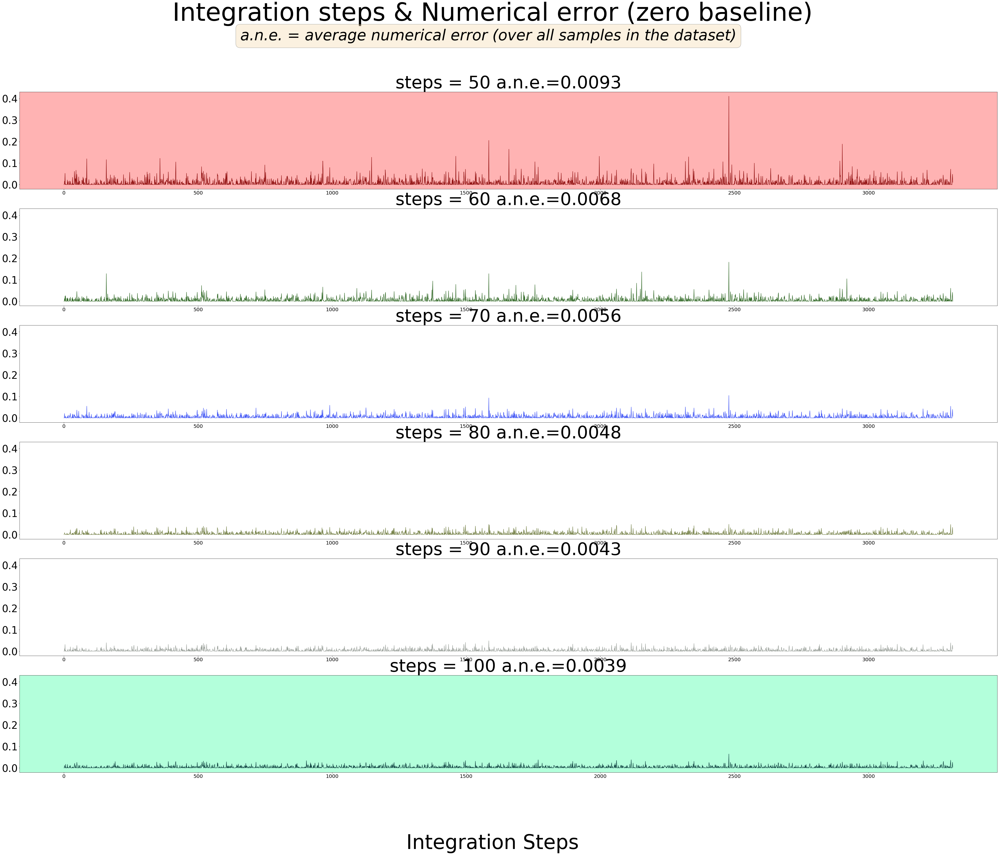

In [414]:
fig, axs = plt.subplots(6, 1, figsize=(70, 50), sharey=True)
fig.canvas.draw()
for (k, v), i in zip(numerical_errors.items(), range(len(axs))):
    axs[i].plot(v, c=color_palette[i])
    axs[i].set_title("steps = {} a.n.e.={:.4f}".format(k, numerical_errors_avg[k]), fontsize=70)
    for tick in axs[i].yaxis.get_major_ticks():
        tick.label.set_fontsize(40)
    for tick in axs[i].xaxis.get_major_ticks():
        tick.label.set_fontsize(20)
axs[0].set_facecolor(color_map['verylightred'])
axs[5].set_facecolor(color_map['verylightgreen'])
title = "Integration steps & Numerical error (zero baseline)"
fig.suptitle(title, fontsize=100)
fig.text(0.5, 0.04, 'Integration Steps', ha='center', fontsize=80)
props = dict(boxstyle='round', facecolor='wheat', alpha=0.4)
fig.text(0.30, 0.95, 'a.n.e. = average numerical error (over all samples in the dataset)', fontsize=60, style='italic',
        verticalalignment='top', bbox=props)
fig.savefig('plots/{}'.format(title.replace(' ', '_')))
plt.show()

In [377]:
caption = "Average Numerical Errors (zero baseline)"
pd.DataFrame.from_dict(numerical_errors_avg, orient='index', columns=['Numerical Errors']).T.style.set_caption(caption).highlight_min(axis=1, color=color_map['verylightgreen']).highlight_max(axis=1, color=color_map['verylightred'])

,50,60,70,80,90,100
Numerical Errors,0.00927733,0.00680281,0.00561964,0.00481503,0.00427052,0.00385318


### Modal baseline

A modal baseline is a baseline where each entry in the baseline corresponds to the most frequent value in a column in the attributions matrix.

We want to understand the importance of choosing a baseline when using the integrated gradients. In that regard, we'll try out a new gradient where the most occuring fingerprints are. 

In [384]:
from scipy.stats import mode
## get baseline of the most frequent fingerprint along rows
baseline_modal = mode(X_test, axis=0)[0].reshape(baseline.shape)

In [385]:
attributions_modal = {}
for step in range(50, 101, 10):    
    attributions_modal[step] = np.array([ig.explain(inp, reference=baseline_modal, num_steps=step) for inp in X_test])

In [386]:
modal_numerical_errors, modal_numerical_errors_avg = {}, {}
for step in attributions_modal.keys():
    diffs = (model.predict(X_test) - model.predict(baseline_modal.reshape(1, -1))).reshape(-1,)
    sums = np.sum(attributions_modal[step], axis=1)
    modal_numerical_errors[step] = np.abs(np.abs(diffs) - np.abs(sums))
    modal_numerical_errors_avg[step] = np.average(modal_numerical_errors[step])

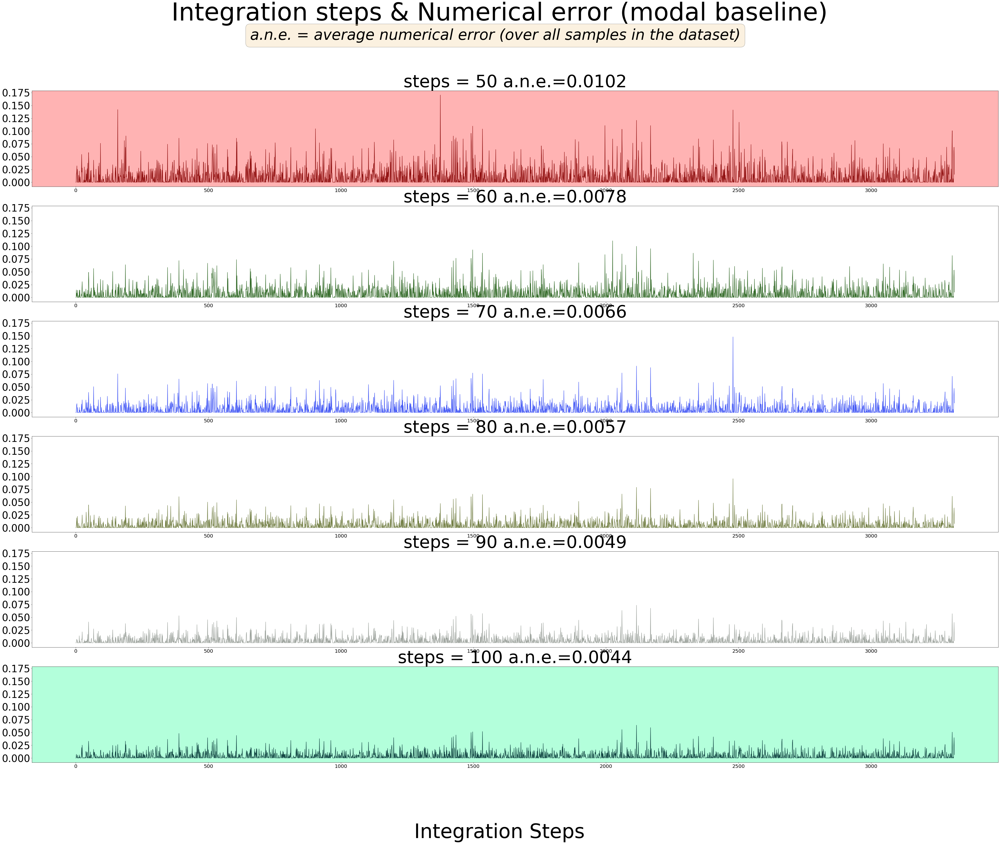

In [415]:
fig, axs = plt.subplots(6, 1, figsize=(70, 50), sharey=True)
for (k, v), i in zip(modal_numerical_errors.items(), range(len(axs))):
    axs[i].plot(v, c=color_palette[i])
    axs[i].set_title("steps = {} a.n.e.={:.4f}".format(k, modal_numerical_errors_avg[k]), fontsize=70)
    for tick in axs[i].yaxis.get_major_ticks():
        tick.label.set_fontsize(40)
    for tick in axs[i].xaxis.get_major_ticks():
        tick.label.set_fontsize(20)
axs[0].set_facecolor(color_map['verylightred'])
axs[5].set_facecolor(color_map['verylightgreen'])
title = "Integration steps & Numerical error (modal baseline)"
fig.suptitle(title, fontsize=100)
fig.text(0.5, 0.04, 'Integration Steps', ha='center', fontsize=80)
props = dict(boxstyle='round', facecolor='wheat', alpha=0.4)
fig.text(0.30, 0.95, 'a.n.e. = average numerical error (over all samples in the dataset)', fontsize=60, style='italic',
        verticalalignment='top', bbox=props)
fig.savefig('plots/{}'.format(title.replace(' ', '_')))
plt.show()

In [416]:
caption = "Average Numerical Errors (modal baseline)"
pd.DataFrame.from_dict(modal_numerical_errors_avg, orient='index', columns=['Numerical Errors']).T.style.set_caption(caption).highlight_min(axis=1, color=color_map['verylightgreen']).highlight_max(axis=1, color=color_map['verylightred'])

,50,60,70,80,90,100
Numerical Errors,0.0101957,0.00782137,0.00658416,0.00570138,0.00488021,0.00443809


### Average Baseline

I'll try the average baseline but I don't think it makes a lot of sense for our datasets, because now we'll get float values in the vector which isn't possible for a bit vector.

In [417]:
baseline_average = np.average(X_test, axis=0)

In [418]:
attributions_average = {}
for step in range(50, 101, 10):
    attributions_average[step] = np.array([ig.explain(inp, reference=baseline_average, num_steps=step) for inp in X_test])

In [419]:
average_numerical_errors, average_numerical_errors_avg = {}, {}
for step in attributions_average.keys():
    diffs = (model.predict(X_test) - model.predict(baseline_average.reshape(1, -1))).reshape(-1,)
    sums = np.sum(attributions_average[step], axis=1)
    average_numerical_errors[step] = np.abs(np.abs(diffs) - np.abs(sums))
    average_numerical_errors_avg[step] = np.average(average_numerical_errors[step])

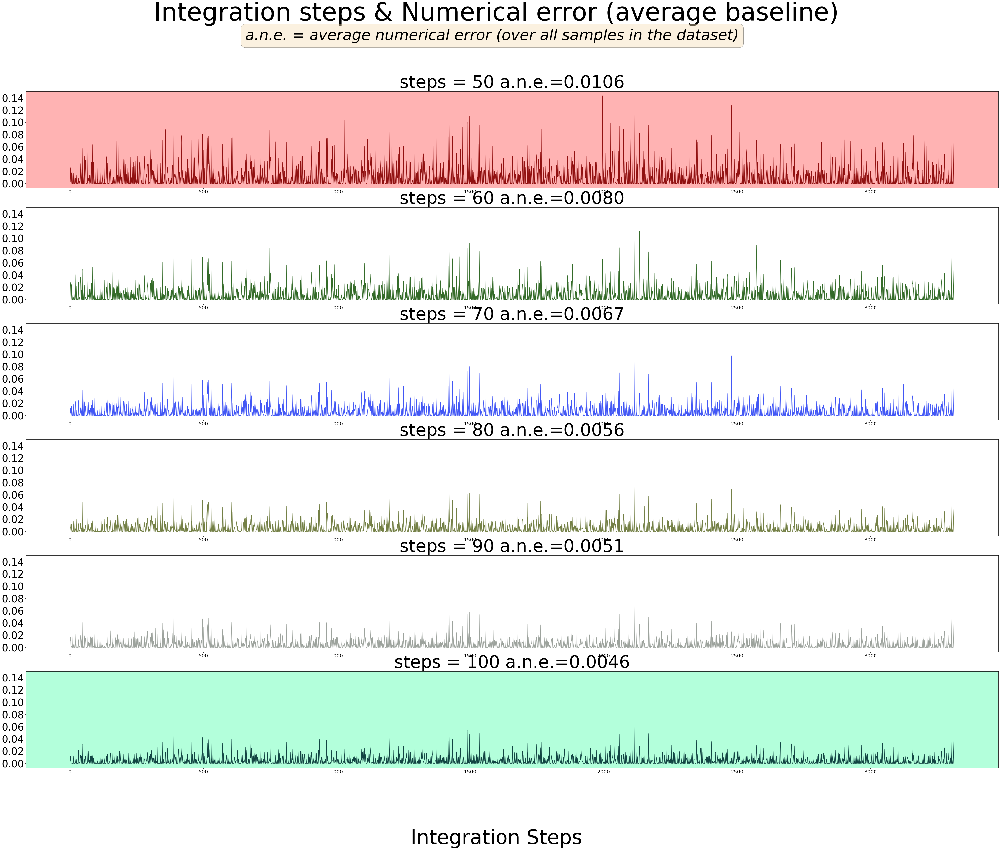

In [420]:
fig, axs = plt.subplots(6, 1, figsize=(70, 50), sharey=True)
for (k, v), i in zip(average_numerical_errors.items(), range(len(axs))):
    axs[i].plot(v, c=color_palette[i])
    axs[i].set_title("steps = {} a.n.e.={:.4f}".format(k, average_numerical_errors_avg[k]), fontsize=70)
    for tick in axs[i].yaxis.get_major_ticks():
        tick.label.set_fontsize(40)
    for tick in axs[i].xaxis.get_major_ticks():
        tick.label.set_fontsize(20)
axs[0].set_facecolor(color_map['verylightred'])
axs[5].set_facecolor(color_map['verylightgreen'])
title = "Integration steps & Numerical error (average baseline)"
fig.suptitle(title, fontsize=100)
fig.text(0.5, 0.04, 'Integration Steps', ha='center', fontsize=80)
props = dict(boxstyle='round', facecolor='wheat', alpha=0.4)
fig.text(0.30, 0.95, 'a.n.e. = average numerical error (over all samples in the dataset)', fontsize=60, style='italic',
        verticalalignment='top', bbox=props)
fig.savefig('plots/{}'.format(title.replace(' ', '_')))
plt.show()

In [421]:
caption = "Average Numerical Errors (average baseline)"
pd.DataFrame.from_dict(average_numerical_errors_avg, orient='index', columns=['Numerical Errors']).T.style.set_caption(caption).highlight_min(axis=1, color=color_map['verylightgreen']).highlight_max(axis=1, color=color_map['verylightred'])

,50,60,70,80,90,100
Numerical Errors,0.0106224,0.00798031,0.00674955,0.00563846,0.0050773,0.00463596


In [512]:
with open('dumped_objects/attributions.pckl', 'wb') as f:
    pickle.dump([attributions, attributions_modal, attributions_average] ,f)

In [ ]:
with open('dumped_objects/attributions.pckl', 'rb') as f:
    attributions, attributions_modal, attributions_average = pickle.load(f)

### Random Baseline

A random baseline is that one where each element is a random bit (either $1$ or $0$). However, here attention is to be paid to the fact that randomness introduces \*luck\*. Which means that in order to avoid randomly well-generated baseline, we have to generate the baseline a number of times and then average the result.

The following calculation is gonna take $45$ per cycle. That's $45 \times 50 =2250\, sec = 37.5\, min$ - *again on my CPU*.

In [ ]:
## takes around 30 min
attributions_randoms, baselines_randoms = [], []
tic()
for i in range(50):
    attributions_random = {}
    baseline_random = np.random.randint(0, high=2, size=X_test.shape[1])
    baselines_randoms.append(baseline_random)
    for step in range(50, 101, 10):
        attributions_random[step] = np.array([ig.explain(inp, reference=baseline_random, num_steps=step) for inp in X_test])
    attributions_randoms.append(attributions_random)
    tac()
tac()

In [513]:
with open('dumped_objects/attributions_randoms.pckl', 'rb') as f:
    attributions_randoms, baselines_randoms = pickle.load(f)

```python
>>> sys.getsizeof(attributions_randoms)/1024/1024
0.0005340576171875
```

This extra step is needed for the random baseline, because once we've calculated the errors for each baseline, we have to average the errors over the baselines (per one step). Therefore the following goes through two processes: one per each randomly generated baseline and correspondingly generated attribution matrix. And one to average the attained numerical errors at each of the previous steps. The final representation is an imaginary random baseline that would have caused the same numerical error, as a truly random baseline would. I.e. has the effect of randomization of *almost* all possible baselines.

The following is also a bit demanding, therefore I'd recommend loading it from disk.

In [560]:
numerical_errors_randoms, numerical_errors_randoms_avg = [], []
for attributions_random, baseline_random in zip(attributions_randoms, baselines_randoms):
    abs_diffs, abs_diffs_avg = {}, {}
    for step in range(50, 101, 10):
        diffs = (model.predict(X_test) - model.predict(baseline_random.reshape(1, -1))).reshape(-1,)
        sums = np.sum(attributions_random[step], axis=1)
        abs_diffs[step] = np.abs(np.abs(diffs) - np.abs(sums))
        abs_diffs_avg[step] = np.average(abs_diffs[step])
    numerical_errors_randoms.append(abs_diffs)
    numerical_errors_randoms_avg.append(abs_diffs_avg)

In [583]:
with open('dumped_objects/numerical_error_randoms.pckl', 'wb') as f:
    pickle.dump([numerical_errors_randoms, numerical_errors_randoms_avg], f)

In [538]:
with open('dumped_objects/numerical_error_randoms.pckl', 'rb') as f:
    numerical_errors_randoms, numerical_errors_randoms_avg = pickle.load(f)

In [580]:
numerical_errors_randoms_per_step, numerical_errors_randoms_avg_per_step = {}, {}
for step in range(50, 101, 10):
    numerical_errors_randoms_per_step[step] = np.average([errors[step] for errors in numerical_errors_randoms], axis=0)
    numerical_errors_randoms_avg_per_step[step] = np.average([errors[step] for errors in numerical_errors_randoms_avg])
    
print(numerical_errors_randoms_per_step)
print(numerical_errors_randoms_avg_per_step)

{50: array([0.00098953, 0.00193782, 0.13228976, ..., 0.43101672, 0.39530202,
       0.26260621]), 60: array([0.00113049, 0.00149067, 0.09459318, ..., 0.33381068, 0.37847825,
       0.17254276]), 70: array([0.00072406, 0.00129943, 0.08274168, ..., 0.25577957, 0.35292989,
       0.14836615]), 80: array([0.0008873 , 0.00106367, 0.07073167, ..., 0.19221594, 0.32280348,
       0.10587501]), 90: array([0.00075252, 0.00127339, 0.06562449, ..., 0.15121776, 0.29190628,
       0.08111203]), 100: array([0.00057255, 0.00101529, 0.05320435, ..., 0.12504427, 0.26317775,
       0.06644517])}
{50: 0.09035705206719591, 60: 0.06808066770186742, 70: 0.052085906290970596, 80: 0.04068708856476619, 90: 0.03247974062058612, 100: 0.02680124229526372}


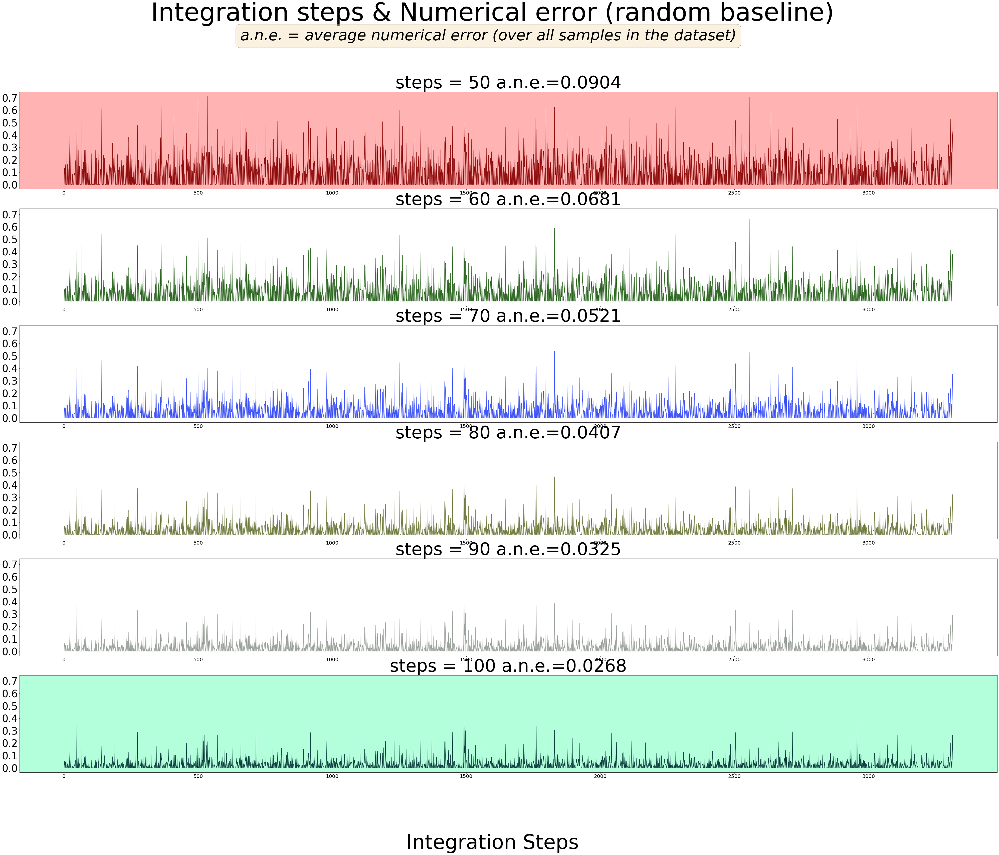

In [584]:
fig, axs = plt.subplots(6, 1, figsize=(70, 50), sharey=True)
for (k, v), i in zip(numerical_errors_randoms_per_step.items(), range(len(axs))):
    axs[i].plot(v, c=color_palette[i])
    axs[i].set_title("steps = {} a.n.e.={:.4f}".format(k, numerical_errors_randoms_avg_per_step[k]), fontsize=70)
    for tick in axs[i].yaxis.get_major_ticks():
        tick.label.set_fontsize(40)
    for tick in axs[i].xaxis.get_major_ticks():
        tick.label.set_fontsize(20)
axs[0].set_facecolor(color_map['verylightred'])
axs[5].set_facecolor(color_map['verylightgreen'])
title = "Integration steps & Numerical error (random baseline)"
fig.suptitle(title, fontsize=100)
fig.text(0.5, 0.04, 'Integration Steps', ha='center', fontsize=80)
props = dict(boxstyle='round', facecolor='wheat', alpha=0.4)
fig.text(0.30, 0.95, 'a.n.e. = average numerical error (over all samples in the dataset)', fontsize=60, style='italic',
        verticalalignment='top', bbox=props)
fig.savefig('plots/{}'.format(title.replace(' ', '_')))
plt.show()

In [586]:
caption = "Average Numerical Errors (random baseline)"
pd.DataFrame.from_dict(numerical_errors_randoms_avg_per_step, orient='index', columns=['Numerical Errors']).T.style.set_caption(caption).highlight_min(axis=1, color=color_map['verylightgreen']).highlight_max(axis=1, color=color_map['verylightred'])

,50,60,70,80,90,100
Numerical Errors,0.0903571,0.0680807,0.0520859,0.0406871,0.0324797,0.0268012


Now we calculate the absolute sum of the values in each vector. <u>A smaller value corresponds to the better baseline</u>.

But in order to make a statement about the numerical error we have to run the above experiment a number of times.

In [587]:
baseline_comparison = {"zero_vector": numerical_errors_avg,
                       "modal": modal_numerical_errors_avg,
                       "average": average_numerical_errors_avg,
                       "random": numerical_errors_randoms_avg_per_step}
pd.DataFrame.from_dict(baseline_comparison, orient='index').T.style.set_caption("Numerical Errors").highlight_min(axis=1, color=color_map['verylightgreen']).highlight_max(axis=1, color=color_map['verylightred']).highlight_min(axis=None, color=color_map['pleasantgreen'])

,zero_vector,modal,average,random
50,0.00927733,0.0101957,0.0106224,0.0903571
60,0.00680281,0.00782137,0.00798031,0.0680807
70,0.00561964,0.00658416,0.00674955,0.0520859
80,0.00481503,0.00570138,0.00563846,0.0406871
90,0.00427052,0.00488021,0.0050773,0.0324797
100,0.00385318,0.00443809,0.00463596,0.0268012


And the winner is the zero-vector, this is obviously not conclusive, because repeating this experiment would probably result in different float values, and hence numerical erros. However, considering the big numerical error found at the random baseline, we can be more on the safe side, by selecting a baseline that numerically doesn't cause a big numerical error. Therefore, we would choose either the zero vector or the model one. In my case I'll select the <u>zero vector</u>.

A more analytical approach to compare the baseline is done down below where the we compare the chemical toxicophores with the one listed in the literature. We expect an adequate baseline to highlight almost identical toxicophores.

<br><br><br><br><br>

# Data Description

## Structural Comparison

Let's compare the molecules that the molecules in the training set to those in the test set. We are going to compare the first 8 molecule from each supplier.

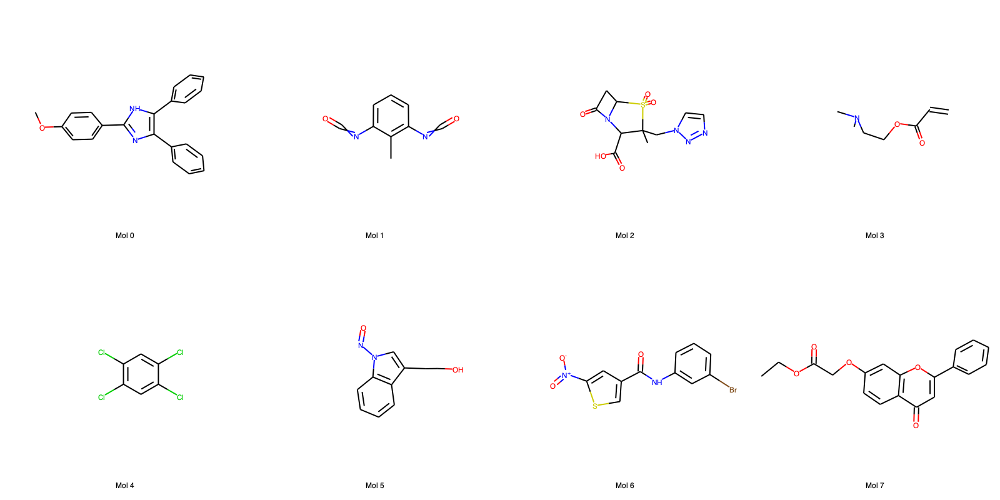

In [934]:
supplier_1_8 = [supplier[i] for i in range(8)]
img = Draw.MolsToGridImage(supplier_1_8, molsPerRow=4, subImgSize=(400, 400), legends=["Mol {}".format(i) for i in range(len(supplier_1_8))])
img.save('plots/first_8_molecules_Train_Set.png')
img

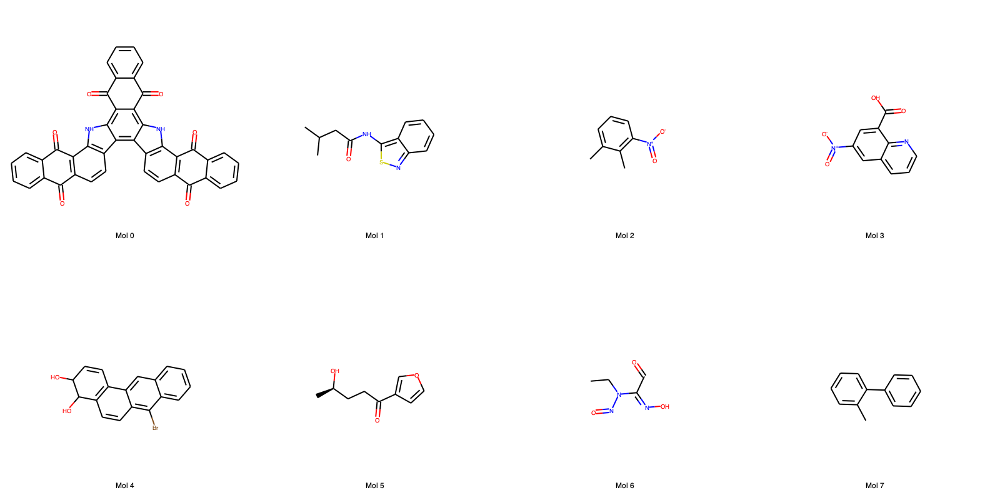

In [1144]:
img = Draw.MolsToGridImage(supplier_test[:8], molsPerRow=4, subImgSize=(400,400), legends=["Mol {}".format(i) for i in range(len(supplier_test[:8]))])
img.save('plots/first_8_molecules_Test_Set.png')
img

And these are some random 8 molecules from each set

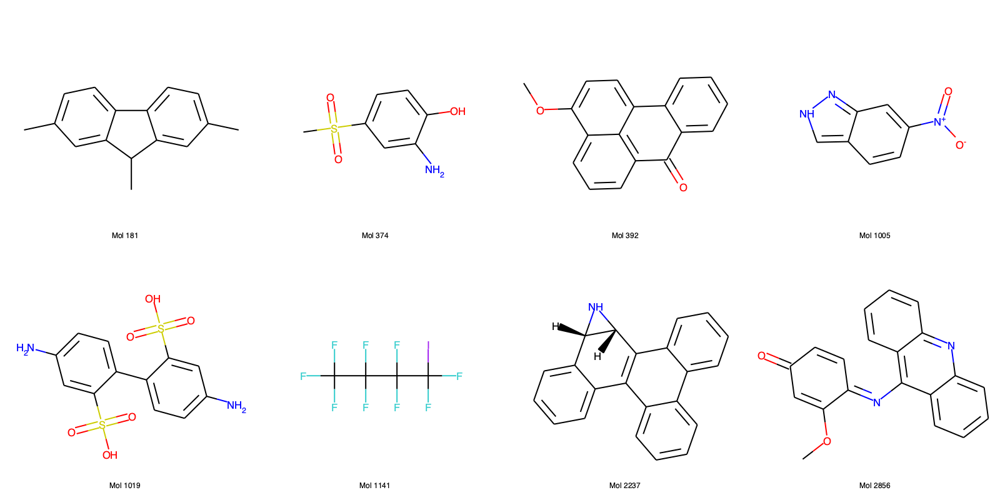

In [959]:
randomly_generated_indices = sorted(np.random.randint(0, len(supplier_test), size=8))
supplier_1_8 = [supplier_test[int(i)] for i in randomly_generated_indices]
img = Draw.MolsToGridImage(supplier_1_8, molsPerRow=4, subImgSize=(400, 400), legends=["Mol {}".format(i) for i in randomly_generated_indices])
img.save('plots/randomly_selected_molecules_Test_Set.png')
img

## Project Attributions on Molecules

I would like to demonstrate what fingerprints (molecular structures) are signaling toxicity within a molecule. We expect these molecules to match the ones listed by the literature (Ames Test).

Also, it would be helpful to understand what a negative/positive attributions are.

Fingerprints indicated at the same index are the same, but activated by different parameters of course. Let's take the molecule $163$ and $184$ as an example and compare some of their fingerprints together.

In [616]:
np.where(X_test.T[1013]==1)

(array([   0,   17,   41,   75,   86,   99,  117,  181,  194,  202,  276,
         300,  334,  355,  386,  399,  427,  524,  561,  568,  587,  589,
         708,  728,  817,  835,  843,  901,  922,  991, 1014, 1037, 1116,
        1122, 1164, 1191, 1203, 1220, 1346, 1493, 1515, 1621, 1785, 1828,
        1861, 1864, 1903, 1909, 1934, 2033, 2038, 2154, 2161, 2195, 2217,
        2230, 2287, 2296, 2386, 2407, 2457, 2468, 2686, 2688, 2701, 2716,
        2777, 2779, 2882, 2895, 2918, 3041, 3091, 3103, 3145, 3173, 3236,
        3285]),)

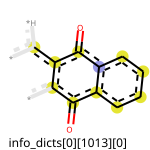

In [756]:
legend = 'info_dicts[0][1013][0]'
svg = Draw.DrawMorganBit(supplier_test[0], 1013, info_dicts[0], 0, legend=legend)
save_svg2png('plots/'+legend+'.png')
SVG(svg)

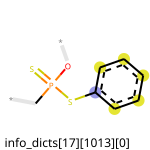

In [757]:
legend = 'info_dicts[17][1013][0]'
svg = Draw.DrawMorganBit(supplier_test[17], 1013, info_dicts[17], 0, legend=legend)
save_svg2png('plots/'+legend+'.png')
SVG(svg)

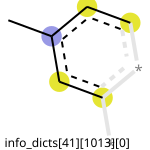

In [758]:
legend = 'info_dicts[41][1013][0]'
svg = Draw.DrawMorganBit(supplier_test[41], 1013, info_dicts[41], 0, legend=legend)
save_svg2png('plots/'+legend+'.png')
SVG(svg)

All fingerprints found at the bit in the bit vector are "similar", <u>not identical</u>. Regardless of the fact that they've been set differently and by different parameters.

In the following I'd like to demonstrate the visualization of fingerprints attributions that we've just calculated using the integrated gradient. In order to do that, I'm going to draw one molecule and then highlight the fingerprint on top of it with both positive and negative attributions. These could be two random molecules that belong to the dataset I have.

<br><br>

----
<br>

<center><font size="5" style="font-weight: bold">Draft</font></center>

To plot the a molecule together with it specific substructure aligned in a 2-d coordinates

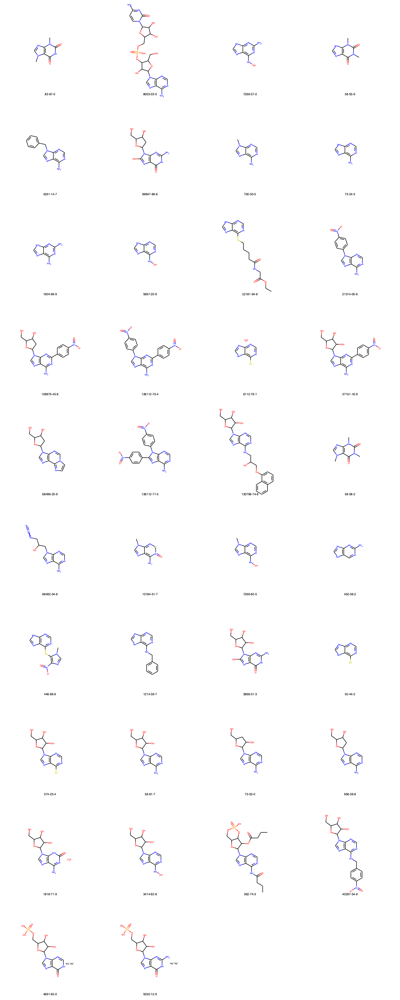

In [135]:
AllChem.Compute2DCoords(substructure)
for m in subms: AllChem.GenerateDepictionMatching2DStructure(m, substructure)
Draw.MolsToGridImage(subms,molsPerRow=4,subImgSize=(400,400),legends=[x.GetProp("_Name") for x in subms])

An alternate (and faster, particularly for large numbers of molecules) approach to do the same thing, using the function `rdkit.Chem.MolFragmentToSmiles()` :

In [ ]:
atoms=set()
for bidx in env:
    atoms.add(m.GetBondWithIdx(bidx).GetBeginAtomIdx())
    atoms.add(m.GetBondWithIdx(bidx).GetEndAtomIdx())

Chem.MolFragmentToSmiles(m,atomsToUse=list(atoms),bondsToUse=env,rootedAtAtom=5)
# 'c(C)(cc)nc'

<br><br>
<center><font size="5" style="font-weight: bold">Draft</font></center>

----

<br>

In [689]:
info_dicts[0]

{290: ((29, 3), (18, 3)),
 314: ((0, 1), (9, 1), (20, 1), (28, 1), (38, 1), (46, 1)),
 331: ((11, 3), (36, 3)),
 504: ((1, 3), (37, 3)),
 525: ((8, 1), (19, 1), (27, 1), (37, 1), (45, 1), (1, 1)),
 650: ((0, 0), (9, 0), (20, 0), (28, 0), (38, 0), (46, 0)),
 747: ((14, 3), (33, 3)),
 764: ((16, 2), (31, 2)),
 776: ((15, 2), (32, 2)),
 826: ((10, 3), (47, 3)),
 909: ((6, 3), (3, 3), (2, 3), (22, 3), (25, 3), (40, 3), (43, 3), (39, 3)),
 917: ((8, 2), (19, 2), (27, 2), (45, 2)),
 1013: ((7, 3), (21, 3), (26, 3), (44, 3)),
 1067: ((13, 3), (34, 3)),
 1088: ((4, 1), (5, 1), (23, 1), (24, 1), (41, 1), (42, 1)),
 1099: ((49, 3), (48, 3)),
 1107: ((19, 3), (27, 3)),
 1114: ((16, 0), (31, 0)),
 1191: ((17, 3), (30, 3)),
 1199: ((4, 2), (5, 2), (23, 2), (24, 2), (41, 2), (42, 2), (10, 2), (47, 2)),
 1230: ((8, 3), (45, 3)),
 1276: ((49, 2), (48, 2)),
 1308: ((11, 2), (36, 2)),
 1314: ((18, 2), (29, 2)),
 1357: ((33, 1),
  (11, 1),
  (14, 1),
  (2, 1),
  (7, 1),
  (21, 1),
  (26, 1),
  (36, 1),
 

In [1052]:
def plot_save_similarityMap(attributions, molId, bitId, whichExample=0, title='monalisa', dpi=100, figsize=(5, 5)):
    if bitId not in info_dicts[molId]:
        raise  Exception('Specified bit is not found in the molecule supplier_[{}]'.format(molId))
    elif whichExample >= len(info_dicts[molId][bitId]):
        raise  Exception('Bit {} was set only {} times. whichExample is set to {}'.format(bitId, len(info_dicts[molId][bitId]), whichExample))
    atomId, radius = info_dicts[molId][bitId][whichExample]
    env = Chem.FindAtomEnvironmentOfRadiusN(supplier_test[molId], radius, atomId)
    amap={}
    refmol = Chem.PathToSubmol(supplier_test[molId], env, atomMap=amap)
    distrib_contrib = attributions[molId][bitId] / supplier_test[molId].GetNumAtoms()
    contribs = [distrib_contrib if i in amap.keys() else .0 for i in range(supplier_test[molId].GetNumAtoms())]
    print(amap)
    fig = SimilarityMaps.GetSimilarityMapFromWeights(supplier_test[molId], contribs, contourLines=5, colors=color_map['darkorange'])
    fig.figsize=figsize
    fig.dpi = dpi
    title = 'unweighted '+title
    fig.suptitle(title, fontsize=16, x=1.2, y=2.2)
    fig.savefig('plots/'+title.replace(' ', '_'), bbox_inches='tight')
    return refmol, amap, fig, contribs

In [1053]:
def plot_save_weightedSimilarityMap(attributions, molId, bitId, whichExample=0, title='monalisa', dpi=100, figsize=(5, 5), savefig=True, contourLines=5, refMol=None):
    """Plots the weighted atomic contributions of a specified substructure/fingerprint environment using similarity maps. Additionally the similarity map is saved to the hard disk.
    The function works on calculating the original environment through specifying the center atom and the lookup radius as well as the original molecule.
    Because multiple fingerprints can be found within one molecule, caller of this function has to specify the fingerprint example to be plotted.
    If the desired substructure has already been computed, the caller pass the substructure using the `refMol` parameter.
    Note on the behavior of this function: some substructure are not kekulizable. Therefore, when attempting to kekulize these molecules, a ValueError is raised. The error is silenced deliberately,
    since we're not interested in kekulizing the substructure completely as long as we can obtain the atomic weights.
    Furthermore, the atomic contributions are calculated by multiplying the atomic weights by the distributed attribution that was obtained using the 
    integrated gradients.
    
    Params:
    -------
    attributions: (matrix like) matrix of attribtuions containing the attribution values found by the integrated gradients, where the rows correspond to the molecules in the dataset, and columns to the bits in the bit vector.
    molId:        (index(int)) target molecule's index that's to be selected plotted
    bitId:        (index(int)) index of the to-bo-highlighted fingerprint. In chemical terms: the refernce molecule molecule. I.e. the environment that we want to reconstruct from the origial molecule.
    whichExample: (index(int)) One molecules produces multiple fingerprints. This is the index of the fingerprint's example found within the specified molecule.
    
    Returns:
    ------
    refmol:       (rdkit.Mol) the reconstructed environment for refernce purposes.
    amap:         (dict) the atomic map, where keys are indices of atoms in the original molecule, and values are indices of atoms in the reference molecule.
    fig:          (matplotlib.fig) figure object for reference/plotting purposes
    contribs:     (list) of length = num. of atoms in the oringal molecules. The list contains the final atomic contributions that are visualized on the plot.
    """
    
    if bitId not in info_dicts[molId]:
        raise  Exception('Specified bit is not found in the molecule supplier_[{}]'.format(molId))
    elif whichExample >= len(info_dicts[molId][bitId]):
        raise  Exception('Bit {} was set only {} times. whichExample is set to {}'.format(bitId, len(info_dicts[molId][bitId]), whichExample))
    atomId, radius = info_dicts[molId][bitId][whichExample]
    # reconstruct the environment
    if refMol is None:
        env = Chem.FindAtomEnvironmentOfRadiusN(supplier_test[molId], radius, atomId)
        amap={}
        refmol = Chem.PathToSubmol(supplier_test[molId], env, atomMap=amap)
    # most important line (weighted contributions)
    try:
        Chem.Kekulize(refmol)
    except:
        pass
    finally:
        weights = SimilarityMaps.GetAtomicWeightsForFingerprint(refmol, supplier_test[0], lambda m, idx: SimilarityMaps.GetMorganFingerprint(m, atomId=idx, radius=3))
    #     plot_save_weightedSimilarityMap(attributions, molId, bitId, whichExample=whichExample, title=title, dpi=dpi, figsize=figsize, refMol=None)
        distrib_contrib = attributions[molId][bitId] / supplier_test[molId].GetNumAtoms()
        contribs = [distrib_contrib * weights[i] if i in amap.keys() else .0 for i in range(supplier_test[molId].GetNumAtoms())]

        print(amap)
        fig = SimilarityMaps.GetSimilarityMapFromWeights(supplier_test[molId], contribs, contourLines=contourLines, colors=color_map['darkorange'])
        fig.figsize=figsize
        fig.dpi = dpi
        title = 'weighted '+title
        fig.suptitle(title, fontsize=16, x=1.2, y=2.2)
        if savefig: fig.savefig('plots/'+title.replace(' ', '_'), bbox_inches='tight')
        return refmol, amap, fig, contribs

{0: 12, 1: 7, 2: 3, 3: 8, 4: 9, 5: 4, 6: 0, 7: 1, 8: 2, 9: 5, 10: 6, 11: 10, 15: 11}


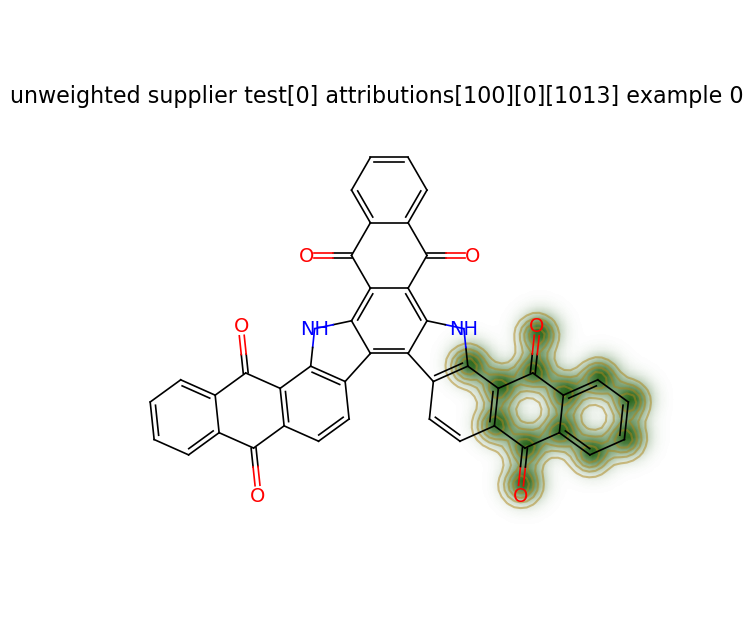

In [1054]:
title = 'supplier test[0] attributions[100][0][1013] example 0'
_ = plot_save_similarityMap(attributions[100], 0, 1013, 0, title)

{17: 9, 18: 4, 19: 0, 20: 5, 21: 1, 22: 2, 23: 6, 24: 11, 25: 7, 26: 3, 27: 8, 28: 12, 29: 10}


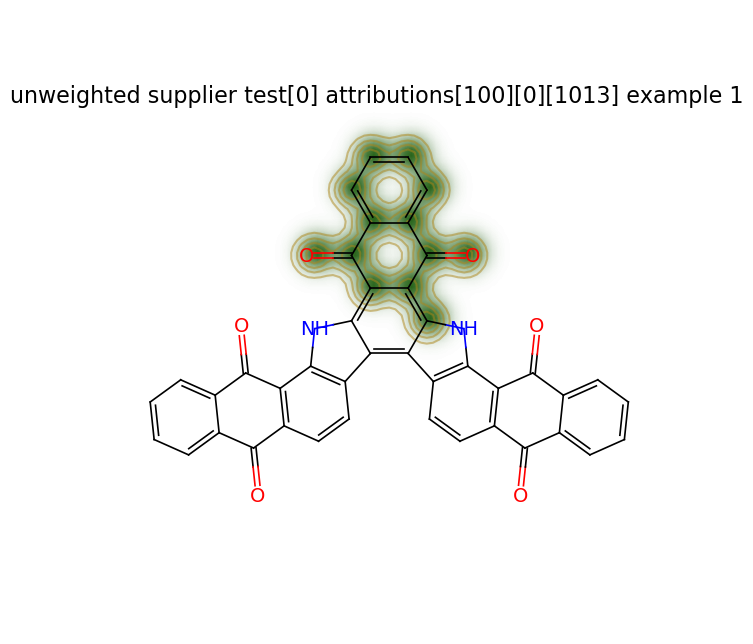

In [1056]:
title = 'supplier test[0] attributions[100][0][1013] example 1'
_ = plot_save_similarityMap(attributions[100], 0, 1013, 1, title)

And when the fingerprint drawn separately...

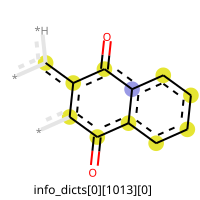

In [765]:
atomId, radius = info_dicts[0][1013][0]
legend = 'info_dicts[0][1013][0]'
svg = Draw.DrawMorganEnv(supplier_test[0], atomId, radius, molSize=(200, 200), legend=legend)
save_svg2png('plots/'+legend+'.png')
SVG(svg)

{8: 10, 10: 6, 11: 9, 12: 4, 13: 0, 14: 1, 15: 2, 16: 5, 17: 8, 18: 13, 30: 12, 33: 11, 48: 7, 49: 3}


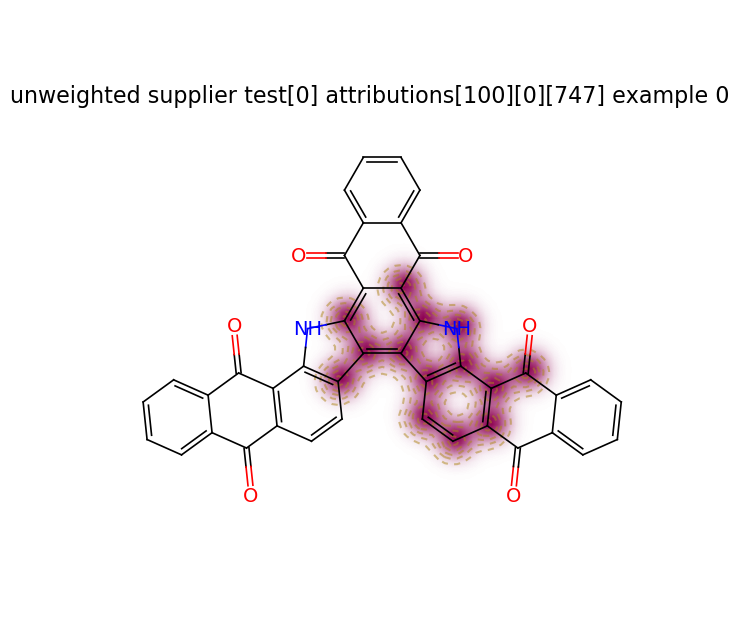

In [1057]:
title = 'supplier test[0] attributions[100][0][747] example 0'
_ = plot_save_similarityMap(attributions[100], 0, 747, 0, title)

{14: 11, 17: 12, 29: 13, 30: 8, 31: 4, 32: 0, 33: 1, 34: 2, 35: 6, 36: 10, 45: 9, 47: 5, 48: 3, 49: 7}


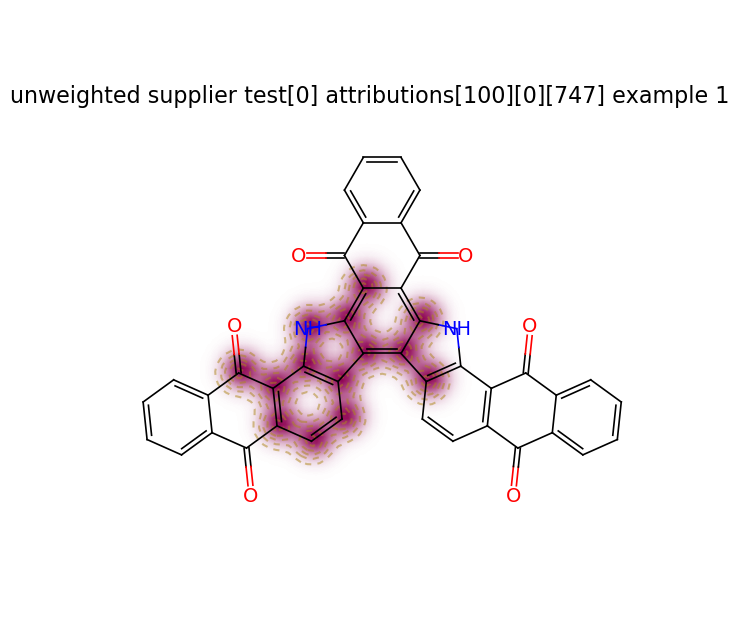

In [1058]:
title = 'supplier test[0] attributions[100][0][747] example 1'
_ = plot_save_similarityMap(attributions[100], 0, 747, 1, title)

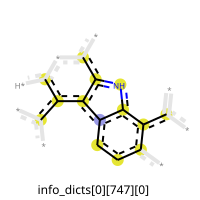

In [780]:
atomId, radius = info_dicts[0][747][0]
legend = 'info_dicts[0][747][0]'
svg = Draw.DrawMorganEnv(supplier_test[0], atomId, radius, molSize=(200, 200), legend=legend)
save_svg2png('plots/'+legend+'.png')
SVG(svg)

### Weighted contributions

But most importantly, because not all atoms get the same attributions in the molecule, before assigning an attribution to an atom, we have to multiply that with the weight (importance) of the atom.

{8: 10, 10: 6, 11: 9, 12: 4, 13: 0, 14: 1, 15: 2, 16: 5, 17: 8, 18: 13, 30: 12, 33: 11, 48: 7, 49: 3}


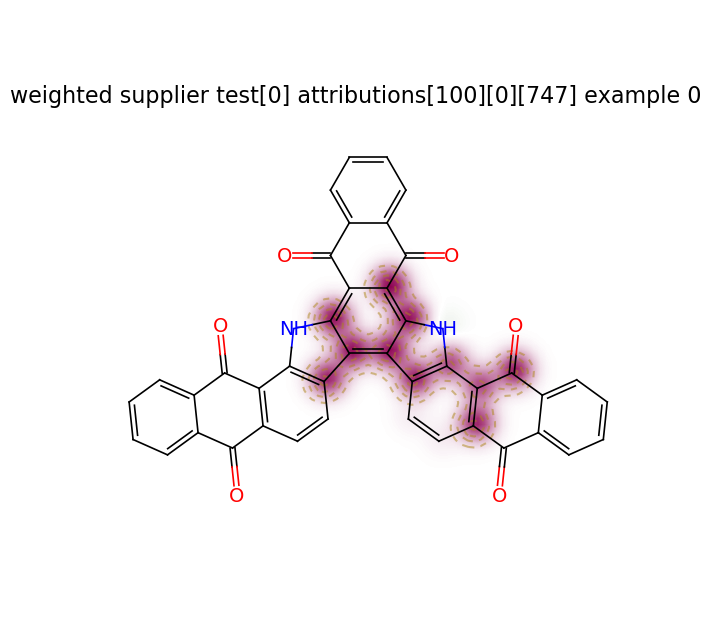

In [1059]:
title = 'supplier test[0] attributions[100][0][747] example 0'
_ = plot_save_weightedSimilarityMap(attributions[100], 0, 747, 0, title, contourLines=6)

Let's look for a bit where weighted contribution are more visible, just for demonstration purposes.

{2: 5, 6: 4, 7: 0, 8: 1, 9: 2, 10: 3, 11: 6, 15: 7}


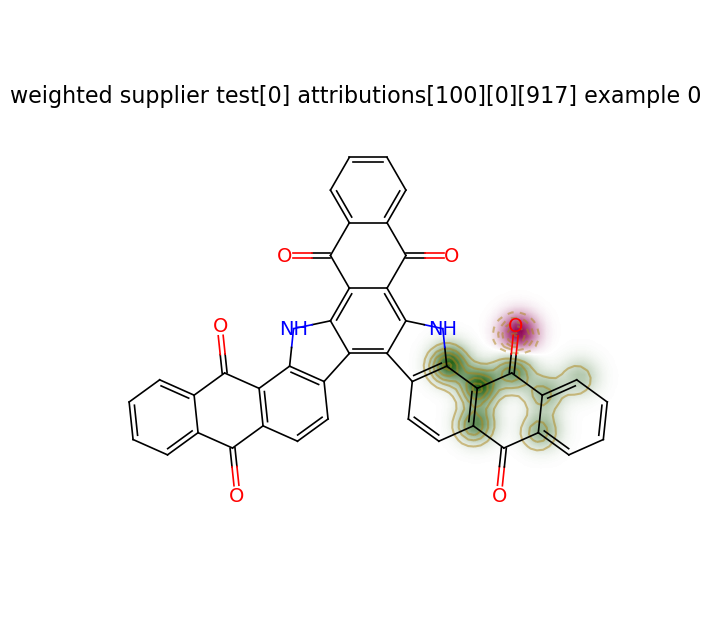

In [1065]:
title = 'supplier test[0] attributions[100][0][917] example 0'
_ = plot_save_weightedSimilarityMap(attributions[100], 0, 917, 0, title, contourLines=10)

Sofar I know only that negative contributions are highlighted in red and positive ones are highlighted in green. We expect a bit to get a similar attribution value along the the same column, but they don't

```python
>>> attributions[100].T[1013][X_test.T[1013]==1]
array([ 1.24137429e-10, -8.82116780e-10, -6.92012406e-09, -5.93336097e-09,
        6.45231421e-08,  7.12668623e-09,  3.23037243e-02,  1.19865739e-02,
        3.57088923e-02,  1.98849776e-09,  1.00814070e-09, -4.26136069e-09,
        1.56876524e-08,  4.35898495e-02,  4.38794565e-02,  3.78811848e-09,
       -1.78408783e-09,  2.21286798e-02,  2.43233538e-02, -5.58076985e-05,
        9.75620806e-03,  1.40262067e-02, -2.71138811e-02,  1.49160542e-09,
        4.05564671e-06,  3.17890596e-02, -3.21835208e-02,  6.24832666e-10,
        4.76986827e-09,  1.96222162e-02, -2.80465429e-09,  2.10309625e-02,
       -5.55453698e-08,  1.03662193e-02, -1.10560191e-02, -2.15684652e-02,
        4.33917279e-09,  1.03704277e-04,  3.66008067e-02, -5.84728420e-03,
        6.62654495e-02, -2.62374663e-02,  1.31809914e-02, -2.40744978e-03,
       -1.07460778e-08,  3.70759808e-06,  5.03157139e-09, -4.08437204e-02,
        1.99311697e-02,  4.58105564e-03, -1.40636658e-09,  3.02727771e-02,
       -4.69422446e-09, -9.82870674e-10,  1.14500773e-02,  2.43266749e-02,
       -6.32796764e-02, -1.67422343e-11, -4.05773401e-02, -2.89093038e-09,
        2.21268916e-02,  5.21791662e-08,  2.09804988e-02, -5.66700464e-10,
       -3.87806964e-02, -1.15964735e-02, -2.93617830e-09, -1.06902981e-02,
       -7.32818618e-06,  2.91545779e-03,  2.04598975e-02, -2.17164754e-09,
       -2.18523667e-09, -1.73502886e-02,  2.83186063e-04, -8.43993121e-09,
       -5.65830994e-02,  2.03680778e-02])
```

## Interpreting Positive and Negative Contribution

As a first notion, we know that a green color means a positive contribution, and a negative one is colored red. However, We still don't need how to associate that with the toxicity of the molecule.

The molecules from before was labeled non toxic, let's find out where in the substructures toxicity is signaled.

```python
>>> y_test[0]
0
```

In [888]:
import io
from PIL import Image

In [1213]:
def highlight_n_substructures_in_mol_i(mol_i, attributions, n_bits=10, indices=None):
    """
    highlightes the first n_bits in a specified molecules. Returns a figure containt subplots with the corresponding substructures.
    size of the plot is self-infered. 
    
    Whenever you call this function use the %%capture keyword at the top of the cell.
    for instance:
    ```
    %%capture
    figure = highlight_n_substructures_in_mol_i(0, attributions[100], n_bits=15)
    ```
    
    Params:
    -------
    mol_i:        (index(int)) ith molecules in the dataset that's to be explored
    attributions: (matrix of size (n_samples, m_features))the attributions matrix of which the atomic contributions must be calculated.
    n_bits:       (int or array like) array containing indices of the desired substructures. If an integer is specified
                  the first n substructures are plotted. Use n_bits, when indices aren't specified.
    indices:      (array-like) an array containing the indices of the desired bits/fingerprints. If specified n_bits is self-inferred. 
    
    Returns:
    --------
    A figure object 
    """
    if indices is None:
        indices = np.where(X_test[mol_i]==1)[0]
    else:
        n_bits = len(indices)
    height_mul = int(n_bits/5) + 1 if int(n_bits/5) < n_bits/5 else int(n_bits/5)
    figure, axs = plt.subplots(height_mul, 5, figsize=(70, 50), sharey=True, sharex=True)
    [ax.set_axis_off() for ax in axs.reshape(-1)]

    for i, n in zip(indices, range(n_bits)):
        title = 'supplier test[{}] attributions[100][{}][{}] example 0'.format(mol_i, mol_i, i)
        _, _, fig, _ = plot_save_weightedSimilarityMap(attributions, mol_i, i, 0, title, contourLines=10)
        img = Image.open('plots/weighted_'+title.replace(' ', '_')+'.png')
    #     cropped_img = img.crop((0, 0, img.width, img.height))
        axs[int(n/5), n%5].imshow(img)
        axs[int(n/5), n%5].set_axis_off()
    # axs[5].set_facecolor(color_map['verylightgreen'])
    suptitle = "Highlighting {} substructures in mol {}".format(n_bits, mol_i)
    figure.suptitle(suptitle, fontsize=100)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.4)
    figure.text(0.20, 0.92, 'Red corresponds to negative attribution. Green corresponds to positive attributions.', fontsize=60, style='italic',
            verticalalignment='top', bbox=props)
    figure.dpi = 100
    figure.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    figure.savefig('plots/{}'.format(suptitle.replace(' ', '_')), dpi=200, bbox_inches='tight')
    return figure

In [1214]:
%%capture
figure = highlight_n_substructures_in_mol_i(0, attributions[100], 8)

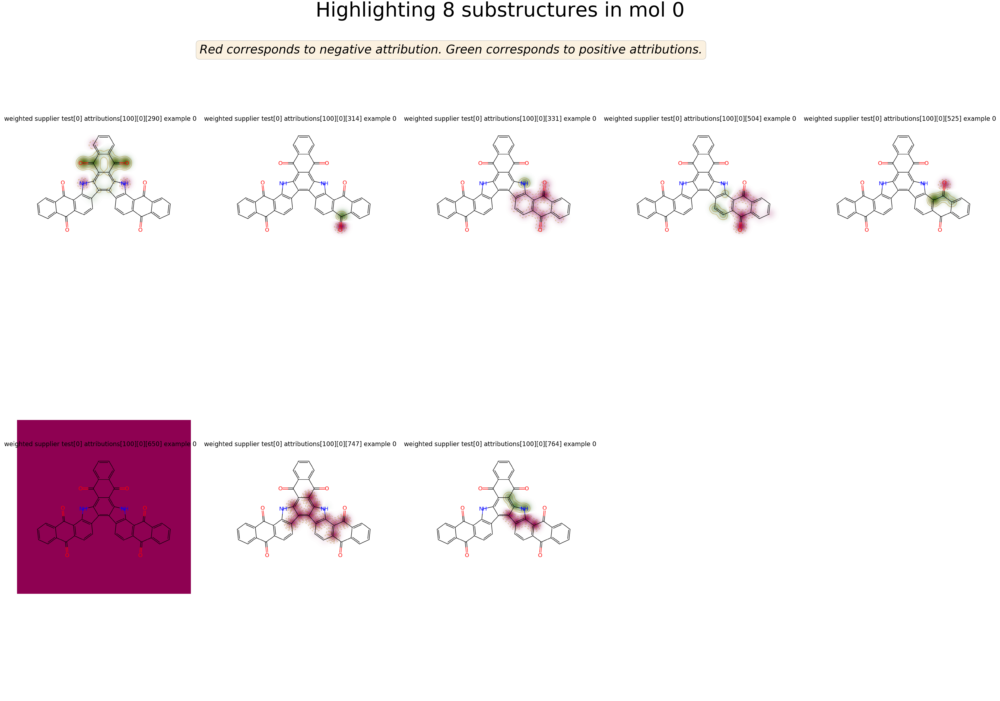

In [1215]:
figure

In [1232]:
%%capture
mol_i = 9
random_fps = sorted(np.random.choice(list(info_dicts[mol_i].keys()), size=15))
figure = highlight_n_substructures_in_mol_i(mol_i, attributions[100], indices=random_fps)

In [ ]:
figure

The prior work wasn't very successful. And isn't informative

In [ ]:
most_frequent_fp_id = X_test.sum(axis=0).argmax() # 1380
if indices is None:
        indices = X_test.T[bit_i][0]
    else:
        n_mols = len(indices)
    height_mul = int(n_bits/5) + 1 if int(n_bits/5) < n_bits/5 else int(n_bits/5)
    figure, axs = plt.subplots(height_mul, 5, figsize=(70, 50), sharey=True, sharex=True)
    [ax.set_axis_off() for ax in axs.reshape(-1)]

    for i, n in zip(indices, range(n_bits)):
        title = 'supplier test[{}] attributions[100][{}][{}] example 0'.format(mol_i, mol_i, i)
        _, _, fig, _ = plot_save_weightedSimilarityMap(attributions, mol_i, i, 0, title, contourLines=10)
        img = Image.open('plots/weighted_'+title.replace(' ', '_')+'.png')
    #     cropped_img = img.crop((0, 0, img.width, img.height))
        axs[int(n/5), n%5].imshow(img)
        axs[int(n/5), n%5].set_axis_off()
    # axs[5].set_facecolor(color_map['verylightgreen'])
    suptitle = "Highlighting {} substructures in mol {}".format(n_bits, mol_i)
    figure.suptitle(suptitle, fontsize=100)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.4)
    figure.text(0.20, 0.92, 'Red corresponds to negative attribution. Green corresponds to positive attributions.', fontsize=60, style='italic',
            verticalalignment='top', bbox=props)
    figure.dpi = 100
    figure.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    figure.savefig('plots/{}'.format(suptitle.replace(' ', '_')), dpi=200, bbox_inches='tight')


We expect a bit to get a similar attribution value along the the same column, but they don't

In [1079]:
%%capture
%%pixie_debugger
def highlight_n_substructures_in_mol_i(mol_i, n_bits=20, attributions=attributions[100], indices=None):
    """
    
    
    """
mol_i, n_bits=20, attributions=attributions[100], indices=None
if indices is None:
    indices = np.where(X_test[mol_i]==1)[0]
else:
    n_bits = len(indices)
height_mul = int(n_bits/5) + 1 if int(n_bits/5) > n_bits/5 else int(n_bits/5)
dst = Image.new('RGB', (730*5, 644*height_mul))
for i, n in zip(indices, range(n_bits)):
    title = 'supplier test[{}] attributions[100][{}][{}] example 0'.format(mol_i, mol_i, i)
    _, _, fig, _ = plot_save_weightedSimilarityMap(attributions, mol_i, i, 0, title, contourLines=10)
    img = Image.open('plots/unweighted_'+title.replace(' ', '_'))
    dst.paste(img, (img.width * (n%5), img.height * int(n/5)))

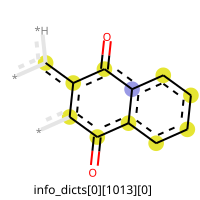

In [765]:
atomId, radius = info_dicts[0][1013][0]
legend = 'info_dicts[0][1013][0]'
svg = Draw.DrawMorganEnv(supplier_test[0], atomId, radius, molSize=(200, 200), legend=legend)
save_svg2png('plots/'+legend+'.png')
SVG(svg)

In [1242]:
most_frequent_fp_id = X_test.sum(axis=0).argmax() # 1380
print(most_frequent_fp_id)
molecules_with_fp1380 = X_test[X_test.T[most_frequent_fp_id] == 1]
molecules_ids_with_fp1380 = np.where(X_test.T[most_frequent_fp_id] == 1)[0]

refmols = contribs = np.empty(shape=X_test.shape)
amaps = np.array([{} for x in range(X_test.size)]).reshape(X_test.shape)

1380
